In [17]:
# Face Brightness Analysis Notebook (with FSB and BIM)
import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, clear_output

# ==========================================
# 1. PATH CONFIGURATION - CRITICAL FIX
# ==========================================
BASE_DIR = "/home/nessessence/mnt_tl_vision16/home/nessessence/uul"
FACE_BRIGHTNESS_DIR = os.path.join(BASE_DIR, "FaceBrightness")
FACE_PARSING_DIR = os.path.join(FACE_BRIGHTNESS_DIR, "face_parsing")

# Clear conflicting paths and add correct ones
sys.path = [p for p in sys.path if "uul" not in p]
sys.path.insert(0, FACE_PARSING_DIR)
sys.path.insert(0, FACE_BRIGHTNESS_DIR)

print("✅ Python path configured:")
for p in sys.path[:2]:
    print(f"→ {p}")

# ==========================================
# 2. IMPORTS WITH VERIFICATION
# ==========================================
try:
    # Verify we're importing from correct location
    import face_parsing.test as face_test
    print(f"✓ Importing from: {face_test.__file__}")
    
    if not face_test.__file__.startswith(FACE_PARSING_DIR):
        raise ImportError("Wrong test.py being imported!")
    
    from face_parsing.test import evaluate
    from demographic_face_analyze import without_beard_region
    print("✓ All imports successful!")
    
except Exception as e:
    print(f"\n❌ Import Error: {e}")
    print("\n🔍 Debugging Info:")
    
    # Check test.py contents
    test_py_path = os.path.join(FACE_PARSING_DIR, "test.py")
    if os.path.exists(test_py_path):
        print(f"\nContents of {test_py_path}:")
        with open(test_py_path, 'r') as f:
            print(f.read(500))  # Show first 500 chars
        
    print("\n💡 Solutions:")
    print("1. Temporary rename conflicting file:")
    print(f"   !mv {BASE_DIR}/test.py {BASE_DIR}/test.py.BAK")
    print("2. Or use absolute import:")
    print("   from FaceBrightness.face_parsing.test import evaluate")
    raise

# ==========================================
# 3. CORE ANALYSIS FUNCTIONS
# ==========================================
def weights_calc(data):
    """Calculate weights for brightness values"""
    num_list = list(data.values())
    total = sum(num_list)
    return np.array([num/total for num in num_list])

def calculate_fsb(image):
    """Calculate Face Skin Brightness (FSB) as per paper"""
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    return np.mean(gray)

def calculate_bim(image):
    """Calculate Brightness Information Metric (BIM)"""
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Calculate histogram
    hist = cv2.calcHist([image], [0], None, [256], [0,256])
    hist /= hist.sum()  # Normalize
    
    level = np.arange(256)
    avg_brightness = np.sum(level * hist.flatten())
    bim = np.sum(np.abs(level - avg_brightness) * hist.flatten())
    return bim

def process_face_image(img_path):
    """Full processing pipeline for single image"""
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise ValueError(f"Could not read image at {img_path}")
    
    # Get face mask
    mask = evaluate([img])[0]  # evaluate expects a list
    
    # Extract upper face region (excluding eyes, nose, lips etc.)
    upper_face = without_beard_region(img, mask)
    
    # Calculate both metrics
    fsb = calculate_fsb(upper_face)
    bim = calculate_bim(upper_face)
    
    return {
        'original': img,
        'mask': mask,
        'upper_face': upper_face,
        'fsb': fsb,
        'bim': bim
    }

# ==========================================
# 4. VISUALIZATION FUNCTIONS
# ==========================================
def display_results(results):
    """Display processing results with matplotlib"""
    # clear_output(wait=True)
    
    # Create figure
    plt.figure(figsize=(18, 5))
    
    # Original Image
    plt.subplot(1, 4, 1)
    plt.imshow(cv2.cvtColor(results['original'], cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')
    
    # Face Mask
    plt.subplot(1, 4, 2)
    plt.imshow(results['mask'], cmap='tab20')
    plt.title("Face Parsing Mask")
    plt.axis('off')
    
    # Upper Face Region
    plt.subplot(1, 4, 3)
    plt.imshow(cv2.cvtColor(results['upper_face'], cv2.COLOR_BGR2RGB))
    plt.title("Upper Face Region")
    plt.axis('off')
    
    # Metrics display
    plt.subplot(1, 4, 4)
    plt.text(0.1, 0.7, f"FSB: {results['fsb']:.2f}\nBIM: {results['bim']:.2f}", 
             fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
    plt.axis('off')
    plt.title("Brightness Metrics")
    
    plt.tight_layout()
    plt.show()
    
    # Brightness Histogram
    gray = cv2.cvtColor(results['upper_face'], cv2.COLOR_BGR2GRAY) if len(results['upper_face'].shape) == 3 else results['upper_face']
    plt.figure(figsize=(10, 4))
    plt.hist(gray.ravel(), 256, [0,256])
    plt.title("Pixel Brightness Distribution")
    plt.xlabel("Brightness Value (0-255)")
    plt.ylabel("Frequency")
    
    # Add FSB and optimal range markers
    plt.axvline(x=results['fsb'], color='r', linestyle='--', label=f'FSB: {results["fsb"]:.1f}')
    plt.axvspan(160, 205, alpha=0.2, color='green', label='Optimal Range (160-205)')
    plt.legend()
    plt.show()
    
    # Print interpretation
    print("\n📊 Interpretation:")
    print(f"- FSB (Face Skin Brightness): {results['fsb']:.1f}/255")
    print(f"- BIM (Brightness Information Metric): {results['bim']:.2f}")
    if results['fsb'] < 160:
        print("  ⚠️ Image may be UNDER-exposed (FSB < 160)")
    elif results['fsb'] > 205:
        print("  ⚠️ Image may be OVER-exposed (FSB > 205)")
    else:
        print("  ✅ Image is in optimal brightness range (160-205)")

# ==========================================
# 5. NOTEBOOK INTERFACE
# ==========================================
def analyze_image(img_path):
    """Complete analysis workflow"""
    try:
        print(f"🔎 Analyzing {os.path.basename(img_path)}...")
        results = process_face_image(img_path)
        display_results(results)
        return results
    except Exception as e:
        print(f"❌ Analysis failed: {e}")
        # raise

# ==========================================
# 6. EXAMPLE USAGE
# ==========================================
# Uncomment to test with your image
# img_path = "/path/to/your/image.jpg"
# analyze_image(img_path)

✅ Python path configured:
→ /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness
→ /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness/face_parsing
✓ Importing from: /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness/face_parsing/test.py
✓ All imports successful!


Processing data_root/data/real_data/mrobbie/raw/r0_0_800_600_w800_h600_fmax.jpg...
🔎 Analyzing r0_0_800_600_w800_h600_fmax.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 10.38it/s]


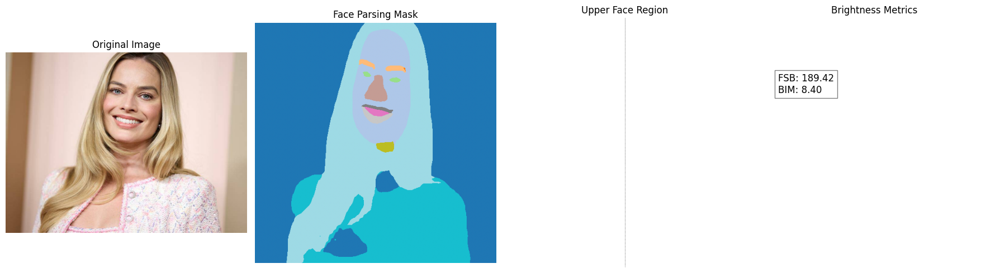

/tmp/ipykernel_3246784/1994873838.py:155: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(gray.ravel(), 256, [0,256])


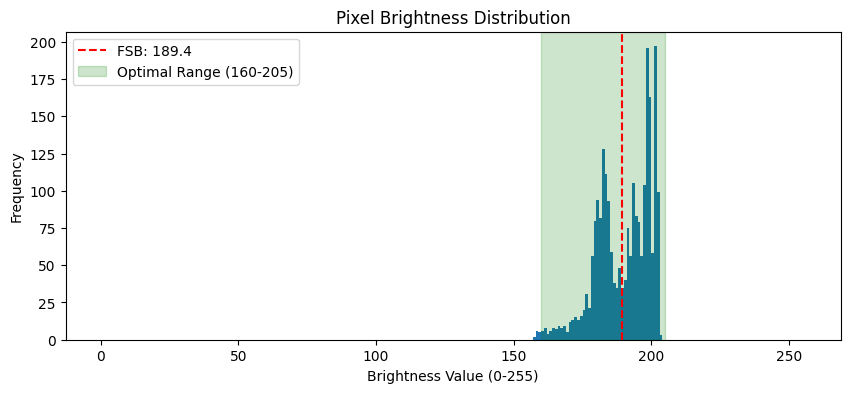


📊 Interpretation:
- FSB (Face Skin Brightness): 189.4/255
- BIM (Brightness Information Metric): 8.40
  ✅ Image is in optimal brightness range (160-205)
Processing data_root/data/real_data/mrobbie/raw/240122_gma_digital_best_of_margot_robbie_hpMain_1x1_992.jpg...
🔎 Analyzing 240122_gma_digital_best_of_margot_robbie_hpMain_1x1_992.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 13.69it/s]


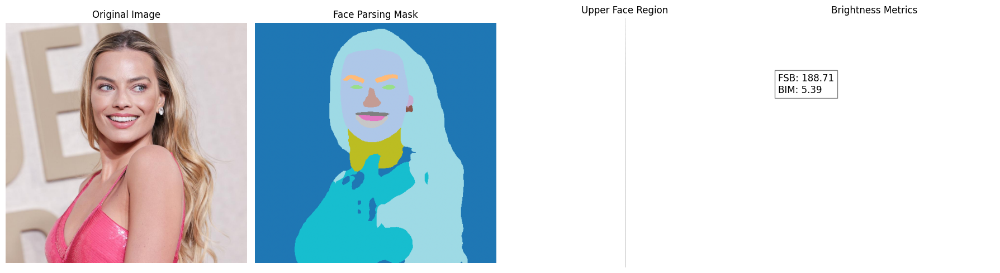

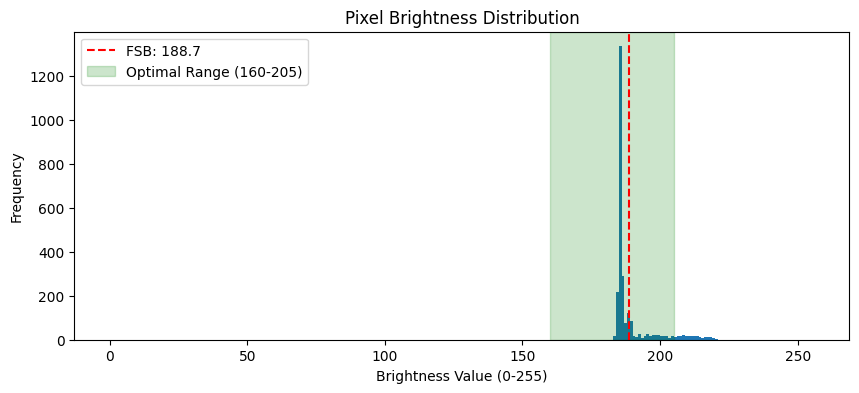


📊 Interpretation:
- FSB (Face Skin Brightness): 188.7/255
- BIM (Brightness Information Metric): 5.39
  ✅ Image is in optimal brightness range (160-205)
Processing data_root/data/real_data/mrobbie/raw/gQgFUN8G-Margot_Robbie_at_Somerset_House_in_2013_(cropped).jpg.jpg...
🔎 Analyzing gQgFUN8G-Margot_Robbie_at_Somerset_House_in_2013_(cropped).jpg.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.36it/s]


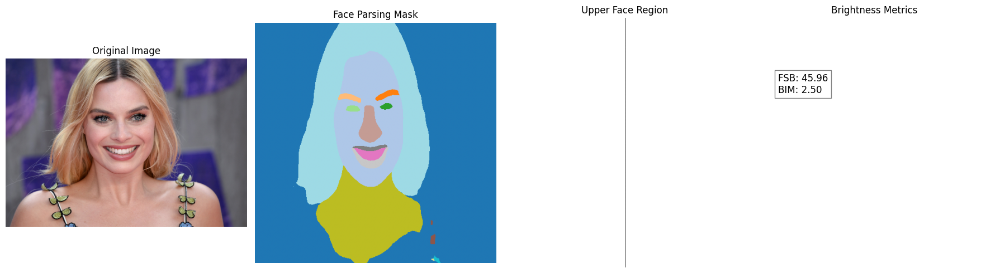

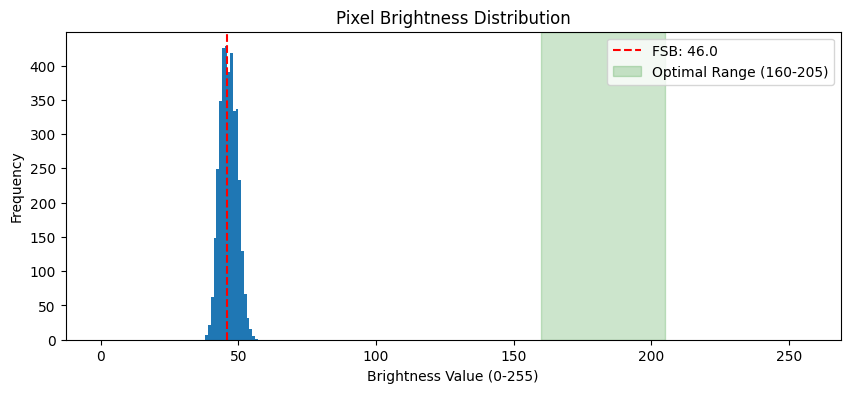


📊 Interpretation:
- FSB (Face Skin Brightness): 46.0/255
- BIM (Brightness Information Metric): 2.50
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/mrobbie/raw/margot-robbie-1995-chanel-011224-1-44fea78792554005a552bbfe39777215.jpg...
🔎 Analyzing margot-robbie-1995-chanel-011224-1-44fea78792554005a552bbfe39777215.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.94it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/mrobbie/raw/margot-robbie-golden-globes-2023.jpg...
🔎 Analyzing margot-robbie-golden-globes-2023.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.33it/s]


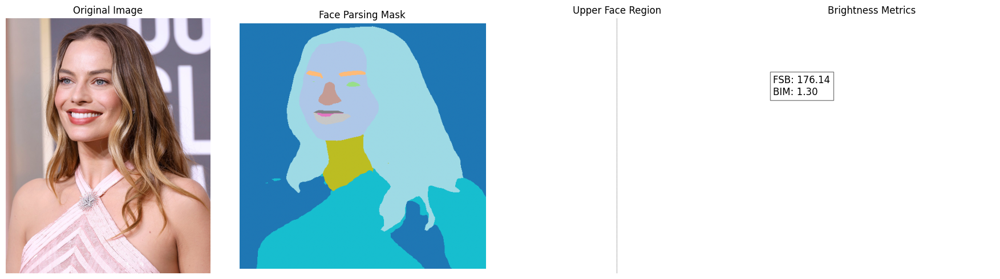

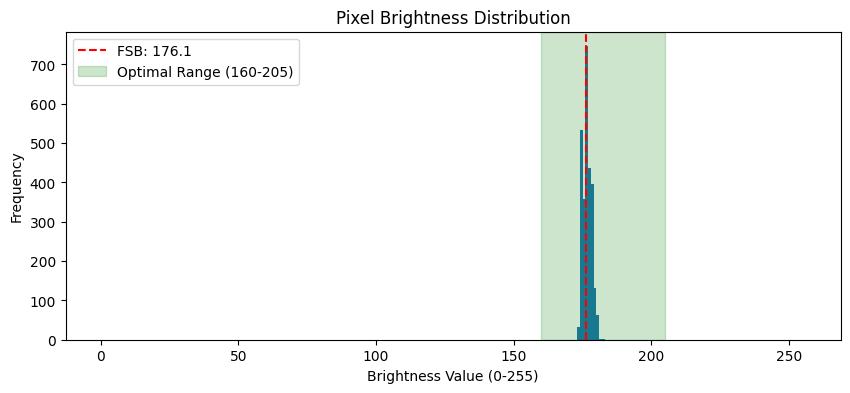


📊 Interpretation:
- FSB (Face Skin Brightness): 176.1/255
- BIM (Brightness Information Metric): 1.30
  ✅ Image is in optimal brightness range (160-205)


In [18]:
dir_path = "data_root/data/real_data/mrobbie/raw"
for img_path in os.listdir(dir_path):
    if (img_path.endswith(".jpg") or img_path.endswith(".png")) and '._' not in img_path:
        full_img_path = os.path.join(dir_path, img_path)
        print(f"Processing {full_img_path}...")
        analyze_image(full_img_path)
        
        
        # try:
        #     analyze_image(full_img_path)
        # except Exception as e:
        #     print(f"Error processing {full_img_path}: {e}")

Processing data_root/data/real_data/osama/raw/5cb8094fd1a8e62a8288331421c23623.jpg...
🔎 Analyzing 5cb8094fd1a8e62a8288331421c23623.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 20.47it/s]


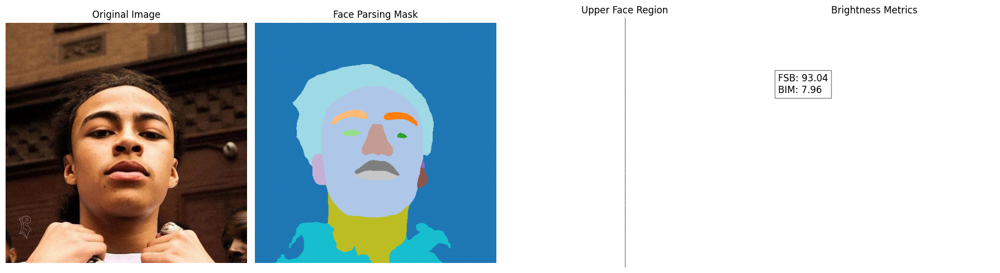

/tmp/ipykernel_3246784/1994873838.py:155: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(gray.ravel(), 256, [0,256])


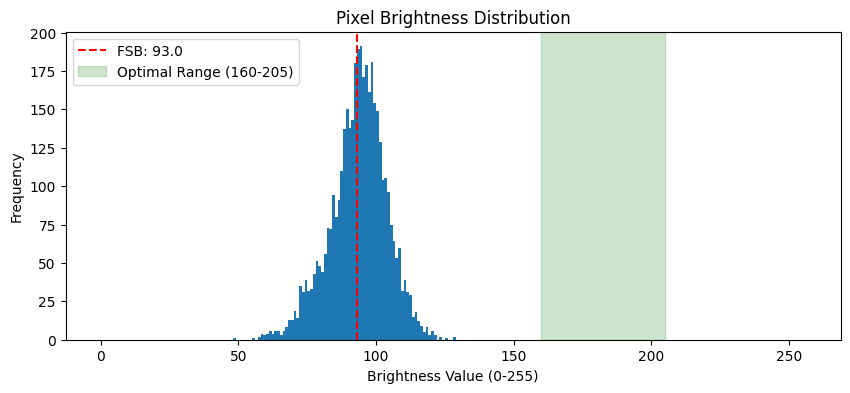


📊 Interpretation:
- FSB (Face Skin Brightness): 93.0/255
- BIM (Brightness Information Metric): 7.96
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/osama/raw/1900x1900-000000-80-0-0.jpg...
🔎 Analyzing 1900x1900-000000-80-0-0.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 21.45it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/osama/raw/468736440_18358672366141293_1065767021219571357_n.jpg...
🔎 Analyzing 468736440_18358672366141293_1065767021219571357_n.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.05it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/osama/raw/576688c5e0577e77649509978c32aabb.jpg...
🔎 Analyzing 576688c5e0577e77649509978c32aabb.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 20.40it/s]


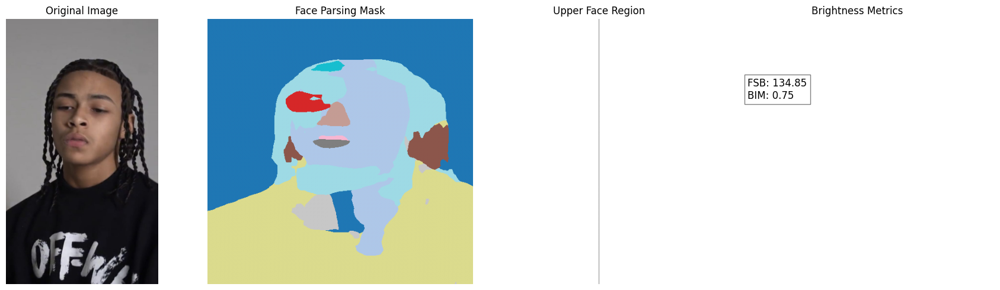

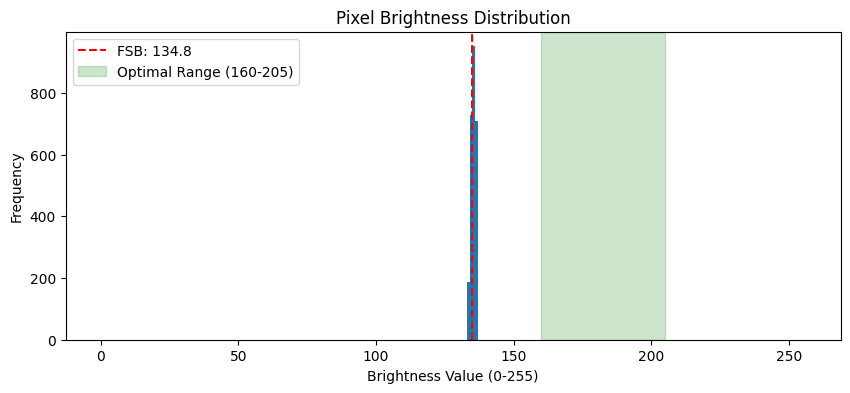


📊 Interpretation:
- FSB (Face Skin Brightness): 134.8/255
- BIM (Brightness Information Metric): 0.75
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/osama/raw/652866ac-fa98-4397-9e7c-675a4ce608b7_TABLET_LANDSCAPE_LARGE_16_9.jpg...
🔎 Analyzing 652866ac-fa98-4397-9e7c-675a4ce608b7_TABLET_LANDSCAPE_LARGE_16_9.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.31it/s]


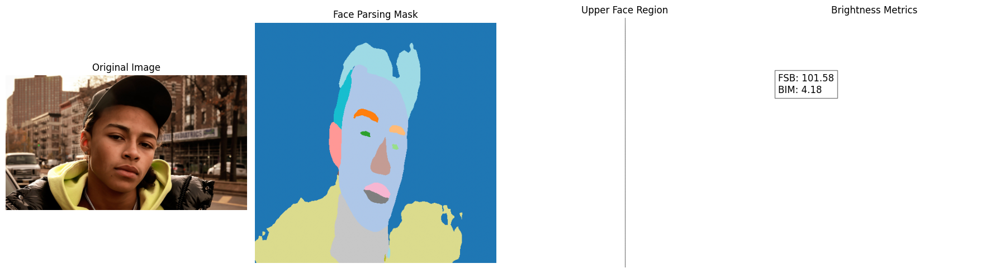

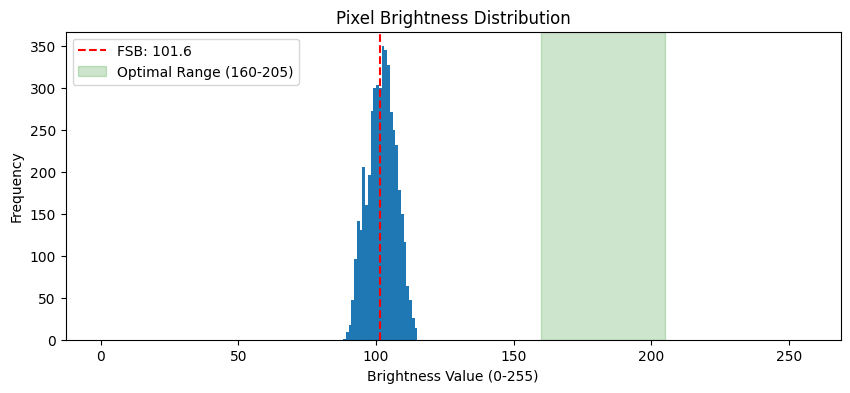


📊 Interpretation:
- FSB (Face Skin Brightness): 101.6/255
- BIM (Brightness Information Metric): 4.18
  ⚠️ Image may be UNDER-exposed (FSB < 160)


In [ ]:
dir_path = "data_root/data/real_data/osama/raw"
for img_path in os.listdir(dir_path):
    if (img_path.endswith(".jpg") or img_path.endswith(".png")) and '._' not in img_path:
        full_img_path = os.path.join(dir_path, img_path)
        print(f"Processing {full_img_path}...")
        analyze_image(full_img_path)

Processing data_root/data/real_data/reese/raw/angelreese5_1744215128_3607060396575013647_269551418.jpg...
🔎 Analyzing angelreese5_1744215128_3607060396575013647_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.00it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1717030800_3378861321096666811_269551418.jpg...
🔎 Analyzing angelreese5_1717030800_3378861321096666811_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 20.85it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1726956309_3462282921766596257_269551418.jpg...
🔎 Analyzing angelreese5_1726956309_3462282921766596257_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00,  7.81it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1740940699_3579592488508923340_269551418.jpg...
🔎 Analyzing angelreese5_1740940699_3579592488508923340_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 14.02it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1729128616_3480505554784833796_269551418.jpg...
🔎 Analyzing angelreese5_1729128616_3480505554784833796_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.22it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746743475_3628269700275371868_269551418.jpg...
🔎 Analyzing angelreese5_1746743475_3628269700275371868_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 12.78it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746655236_3627529498514891762_269551418.jpg...
🔎 Analyzing angelreese5_1746655236_3627529498514891762_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 21.93it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746743474_3628269700090694501_269551418.jpg...
🔎 Analyzing angelreese5_1746743474_3628269700090694501_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1728248440_3473122108350281266_269551418.jpg...
🔎 Analyzing angelreese5_1728248440_3473122108350281266_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.46it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1726956309_3462282921884182032_269551418.jpg...
🔎 Analyzing angelreese5_1726956309_3462282921884182032_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.36it/s]


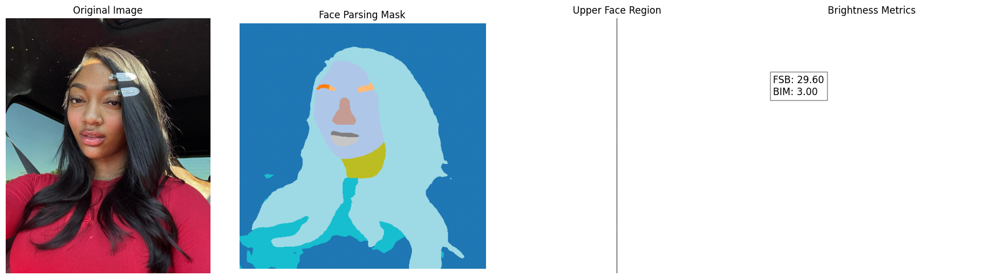

/tmp/ipykernel_3246784/1994873838.py:155: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(gray.ravel(), 256, [0,256])


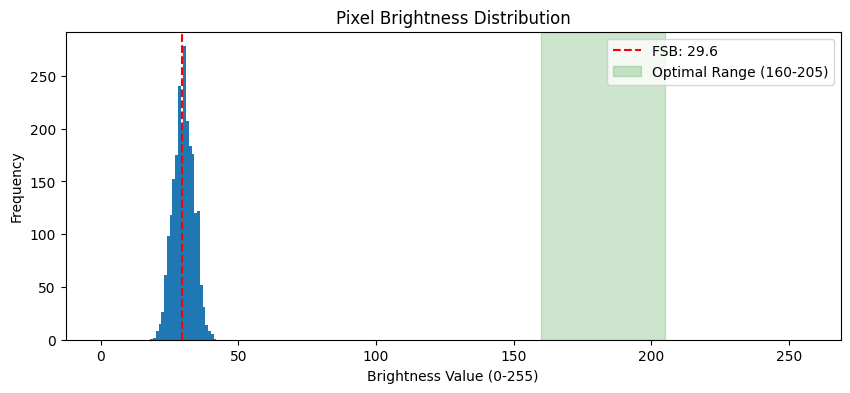


📊 Interpretation:
- FSB (Face Skin Brightness): 29.6/255
- BIM (Brightness Information Metric): 3.00
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1740940699_3579592488517216387_269551418.jpg...
🔎 Analyzing angelreese5_1740940699_3579592488517216387_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.20it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746655236_3627529498514911348_269551418.jpg...
🔎 Analyzing angelreese5_1746655236_3627529498514911348_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 21.01it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1726956309_3462282921758196210_269551418.jpg...
🔎 Analyzing angelreese5_1726956309_3462282921758196210_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.55it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1736724651_3544225719292295187_269551418.jpg...
🔎 Analyzing angelreese5_1736724651_3544225719292295187_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.68it/s]


❌ Analysis failed: index 5113 is out of bounds for axis 0 with size 5113
Processing data_root/data/real_data/reese/raw/angelreese5_1748301325_3641337900496975350_269551418.jpg...
🔎 Analyzing angelreese5_1748301325_3641337900496975350_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.46it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1750377787_3658756519815344696_269551418.jpg...
🔎 Analyzing angelreese5_1750377787_3658756519815344696_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1729091116_3480190980911212459_269551418.jpg...
🔎 Analyzing angelreese5_1729091116_3480190980911212459_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.75it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743692427_3602675658254838312_269551418.jpg...
🔎 Analyzing angelreese5_1743692427_3602675658254838312_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.50it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1732475413_3508580526036333703_269551418.jpg...
🔎 Analyzing angelreese5_1732475413_3508580526036333703_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.43it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1739129932_3564402675073946307_269551418.jpg...
🔎 Analyzing angelreese5_1739129932_3564402675073946307_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 14.09it/s]


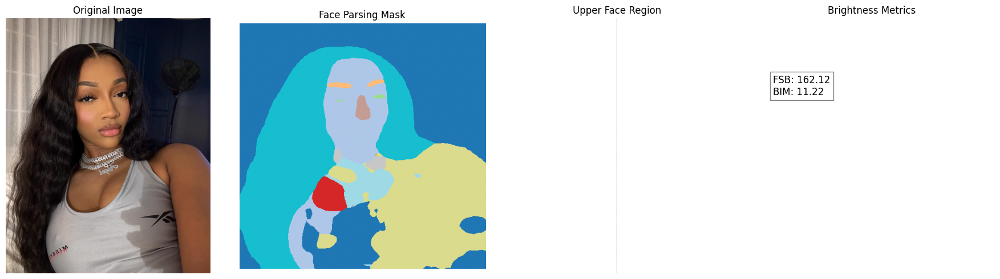

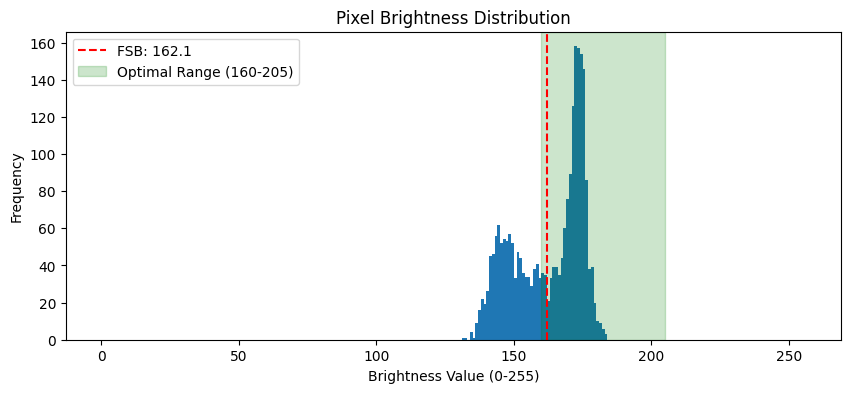


📊 Interpretation:
- FSB (Face Skin Brightness): 162.1/255
- BIM (Brightness Information Metric): 11.22
  ✅ Image is in optimal brightness range (160-205)
Processing data_root/data/real_data/reese/raw/angelreese5_1743959154_3604913126886708164_269551418.jpg...
🔎 Analyzing angelreese5_1743959154_3604913126886708164_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.80it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1748806256_3645573567925112959_269551418.jpg...
🔎 Analyzing angelreese5_1748806256_3645573567925112959_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.01it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743692427_3602675658254835155_269551418.jpg...
🔎 Analyzing angelreese5_1743692427_3602675658254835155_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 24.62it/s]


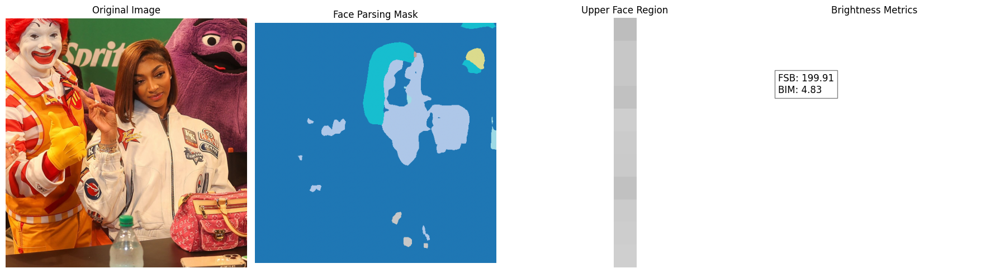

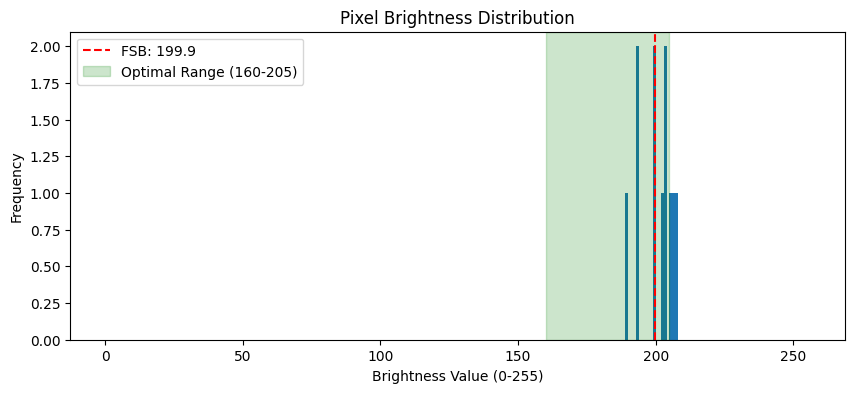


📊 Interpretation:
- FSB (Face Skin Brightness): 199.9/255
- BIM (Brightness Information Metric): 4.83
  ✅ Image is in optimal brightness range (160-205)
Processing data_root/data/real_data/reese/raw/angelreese5_1748806256_3645573568109498424_269551418.jpg...
🔎 Analyzing angelreese5_1748806256_3645573568109498424_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.62it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1742317235_3591139709848112049_269551418.jpg...
🔎 Analyzing angelreese5_1742317235_3591139709848112049_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 24.20it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1744215128_3607060396575009197_269551418.jpg...
🔎 Analyzing angelreese5_1744215128_3607060396575009197_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.94it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746125552_3623086191965376884_269551418.jpg...
🔎 Analyzing angelreese5_1746125552_3623086191965376884_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.90it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1728948609_3478995548352769602_269551418.jpg...
🔎 Analyzing angelreese5_1728948609_3478995548352769602_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.83it/s]


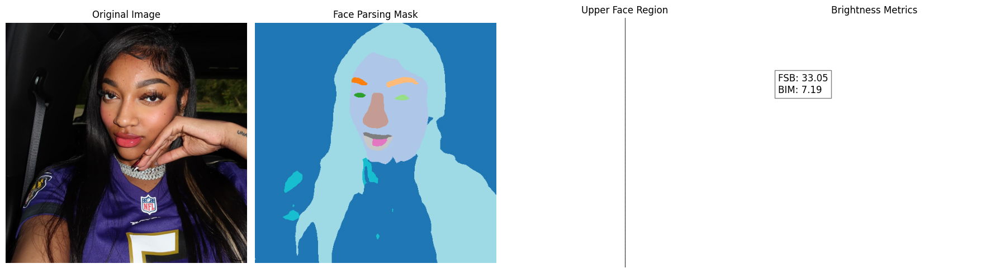

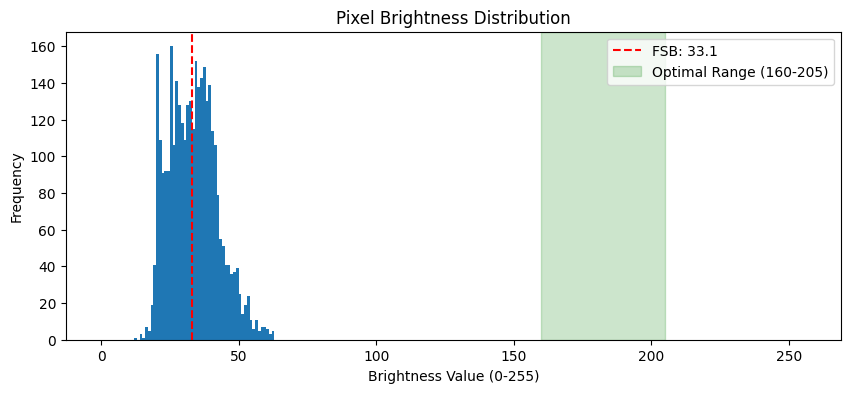


📊 Interpretation:
- FSB (Face Skin Brightness): 33.1/255
- BIM (Brightness Information Metric): 7.19
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1738519418_3559281313607961683_269551418.jpg...
🔎 Analyzing angelreese5_1738519418_3559281313607961683_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.69it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1728948609_3478995548361121009_269551418.jpg...
🔎 Analyzing angelreese5_1728948609_3478995548361121009_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.37it/s]


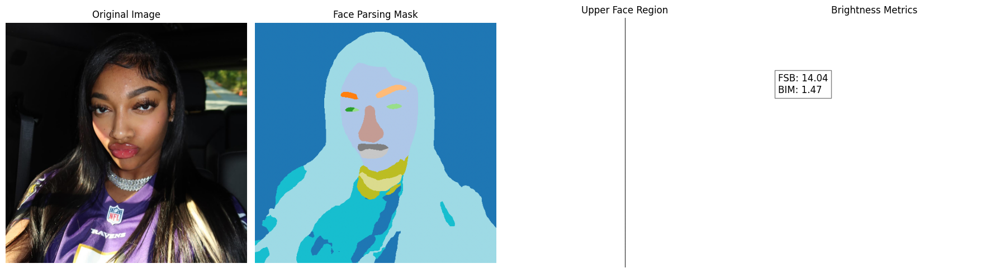

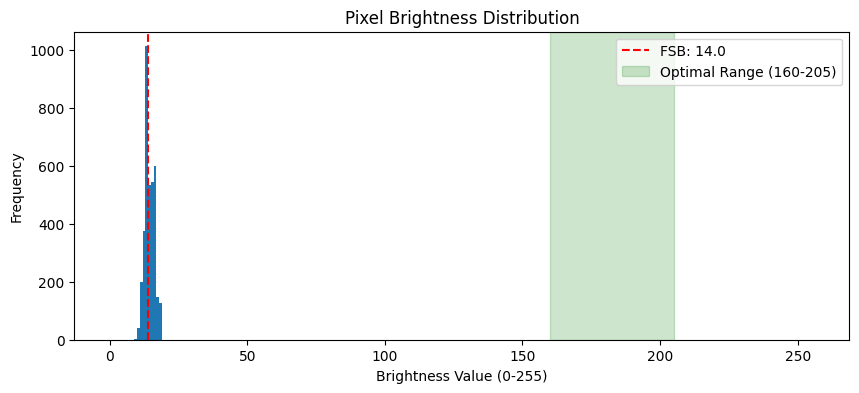


📊 Interpretation:
- FSB (Face Skin Brightness): 14.0/255
- BIM (Brightness Information Metric): 1.47
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1747868450_3637706679073336001_269551418.jpg...
🔎 Analyzing angelreese5_1747868450_3637706679073336001_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.22it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1734653707_3526853382406543599_269551418.jpg...
🔎 Analyzing angelreese5_1734653707_3526853382406543599_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.43it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1744315659_3607903708127398731_269551418.jpg...
🔎 Analyzing angelreese5_1744315659_3607903708127398731_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.04it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1735078821_3530419495421961893_269551418.jpg...
🔎 Analyzing angelreese5_1735078821_3530419495421961893_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.67it/s]


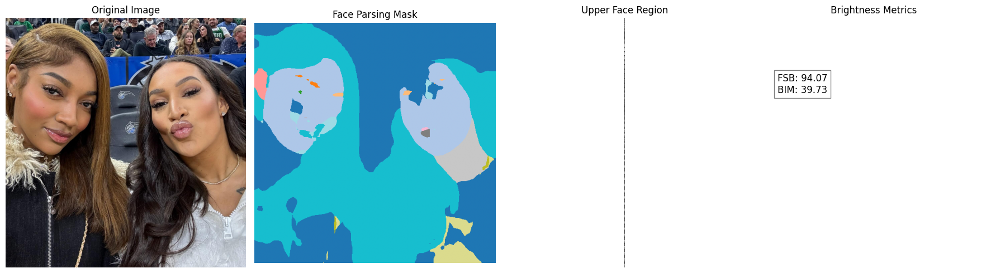

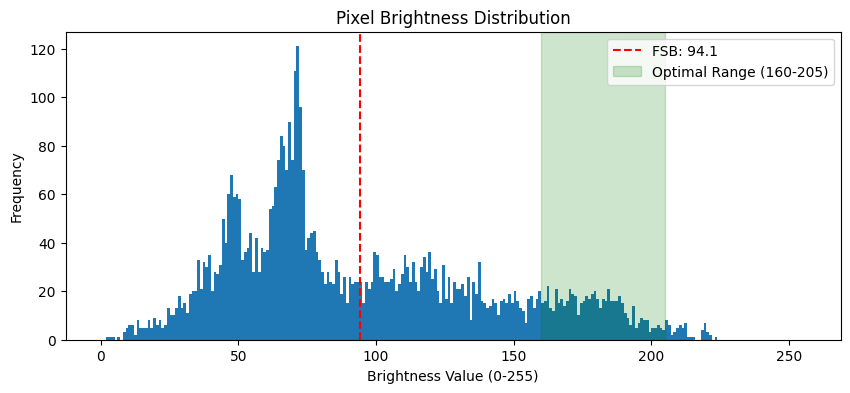


📊 Interpretation:
- FSB (Face Skin Brightness): 94.1/255
- BIM (Brightness Information Metric): 39.73
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1748469724_3642750527747010703_269551418.jpg...
🔎 Analyzing angelreese5_1748469724_3642750527747010703_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 14.24it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1740345699_3574601272042222895_269551418.jpg...
🔎 Analyzing angelreese5_1740345699_3574601272042222895_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.59it/s]


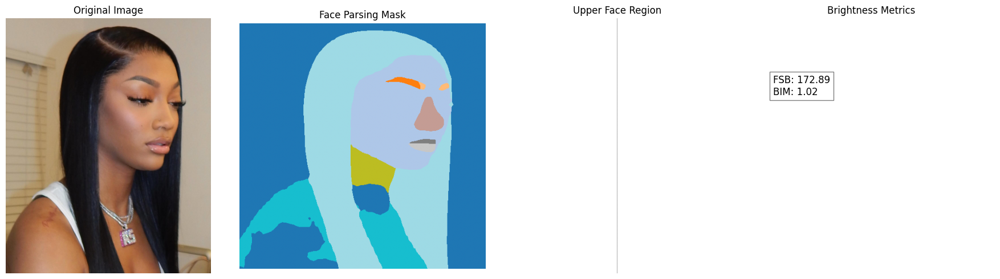

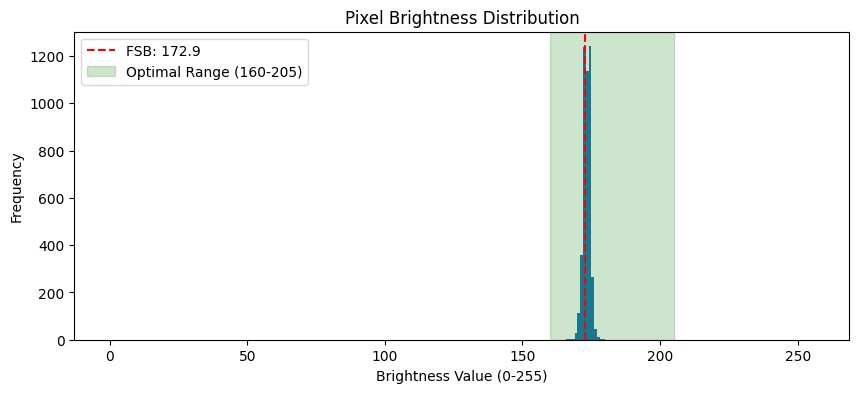


📊 Interpretation:
- FSB (Face Skin Brightness): 172.9/255
- BIM (Brightness Information Metric): 1.02
  ✅ Image is in optimal brightness range (160-205)
Processing data_root/data/real_data/reese/raw/angelreese5_1728248440_3473122108325087921_269551418.jpg...
🔎 Analyzing angelreese5_1728248440_3473122108325087921_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.91it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1740495942_3575861596103823715_269551418.jpg...
🔎 Analyzing angelreese5_1740495942_3575861596103823715_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.11it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1735078821_3530419495438742489_269551418.jpg...
🔎 Analyzing angelreese5_1735078821_3530419495438742489_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.35it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1735078821_3530419495430350182_269551418.jpg...
🔎 Analyzing angelreese5_1735078821_3530419495430350182_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.19it/s]
/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_3246784/1994873838.py:82: RuntimeWarning: invalid value encountered in divide
  hist /= hist.sum()  # Normalize


❌ Analysis failed: OpenCV(4.12.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Processing data_root/data/real_data/reese/raw/angelreese5_1746655236_3627529499060199272_269551418.jpg...
🔎 Analyzing angelreese5_1746655236_3627529499060199272_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.80it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746125552_3623086192150176959_269551418.jpg...
🔎 Analyzing angelreese5_1746125552_3623086192150176959_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.44it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1733418139_3516488688441370680_269551418.jpg...
🔎 Analyzing angelreese5_1733418139_3516488688441370680_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.35it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743692427_3602675658372296113_269551418.jpg...
🔎 Analyzing angelreese5_1743692427_3602675658372296113_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.22it/s]


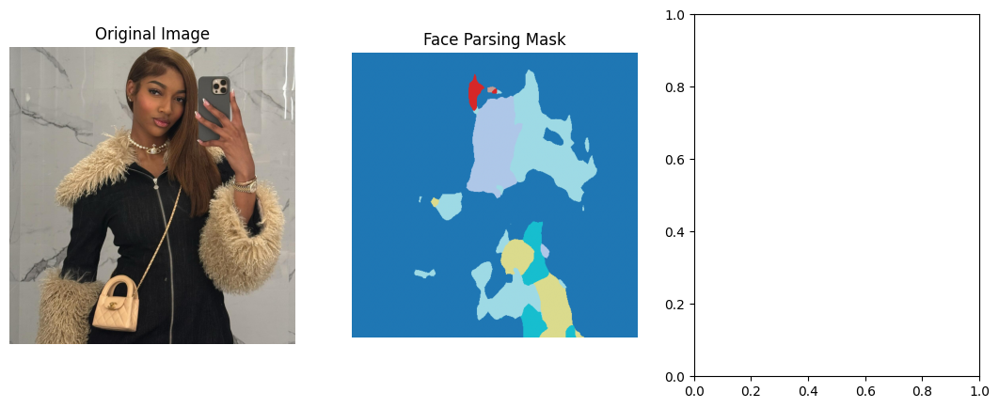

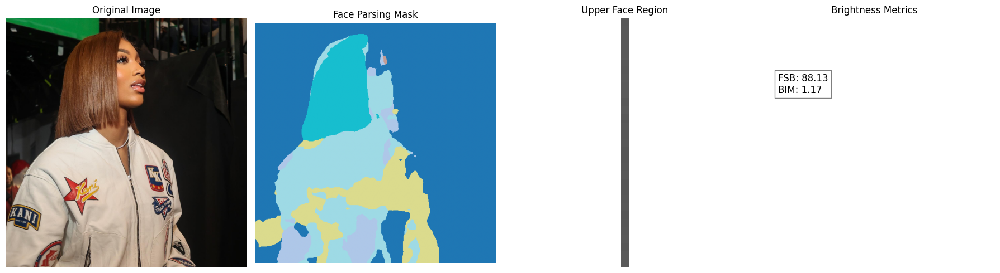

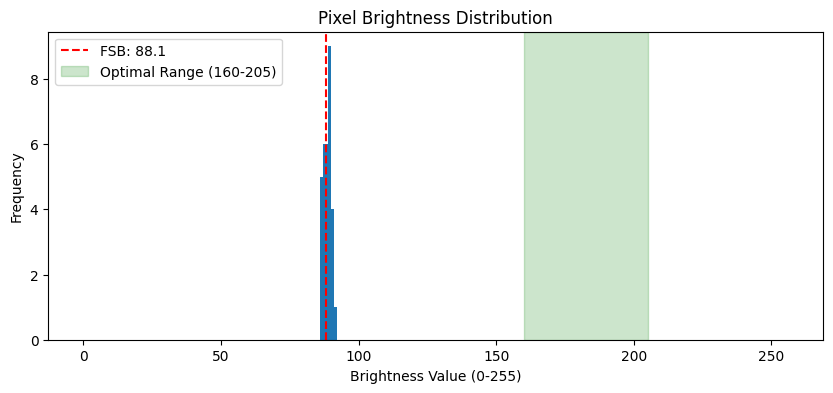


📊 Interpretation:
- FSB (Face Skin Brightness): 88.1/255
- BIM (Brightness Information Metric): 1.17
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1731261613_3498398436061842236_269551418.jpg...
🔎 Analyzing angelreese5_1731261613_3498398436061842236_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 14.54it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743292864_3599323879702255372_269551418.jpg...
🔎 Analyzing angelreese5_1743292864_3599323879702255372_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00,  4.17it/s]


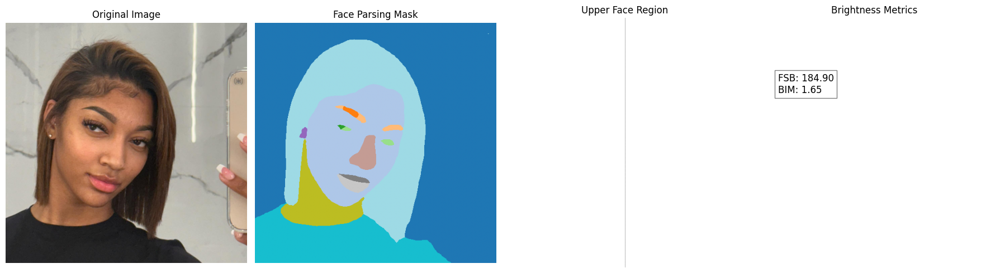

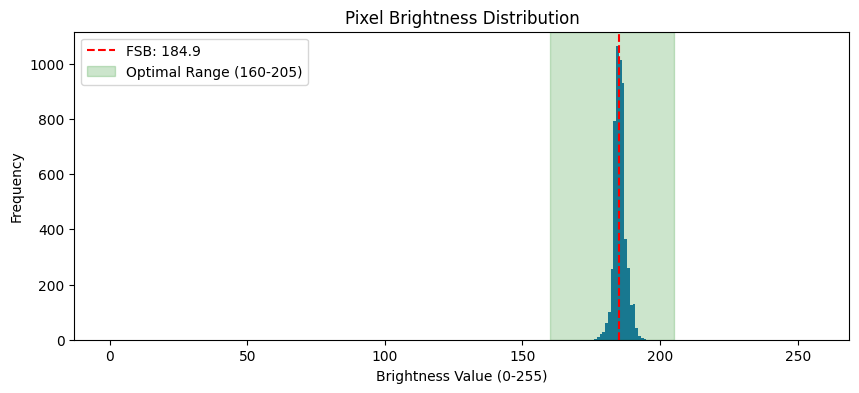


📊 Interpretation:
- FSB (Face Skin Brightness): 184.9/255
- BIM (Brightness Information Metric): 1.65
  ✅ Image is in optimal brightness range (160-205)
Processing data_root/data/real_data/reese/raw/angelreese5_1717030800_3378861321071431762_269551418.jpg...
🔎 Analyzing angelreese5_1717030800_3378861321071431762_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.27it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1731261613_3498398436036447599_269551418.jpg...
🔎 Analyzing angelreese5_1731261613_3498398436036447599_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 15.82it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746743474_3628269700099174916_269551418.jpg...
🔎 Analyzing angelreese5_1746743474_3628269700099174916_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 15.01it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743959154_3604913126886623061_269551418.jpg...
🔎 Analyzing angelreese5_1743959154_3604913126886623061_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.12it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1729128616_3480505554801657935_269551418.jpg...
🔎 Analyzing angelreese5_1729128616_3480505554801657935_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 15.48it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1750377787_3658756520050191256_269551418.jpg...
🔎 Analyzing angelreese5_1750377787_3658756520050191256_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00,  5.21it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1747868450_3637706679165443153_269551418.jpg...
🔎 Analyzing angelreese5_1747868450_3637706679165443153_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.32it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743692427_3602675658514905223_269551418.jpg...
🔎 Analyzing angelreese5_1743692427_3602675658514905223_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.14it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1738519418_3559281313859688002_269551418.jpg...
🔎 Analyzing angelreese5_1738519418_3559281313859688002_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.88it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1729091116_3480190980894307488_269551418.jpg...
🔎 Analyzing angelreese5_1729091116_3480190980894307488_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 15.40it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1728948609_3478995548461852581_269551418.jpg...
🔎 Analyzing angelreese5_1728948609_3478995548461852581_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.46it/s]


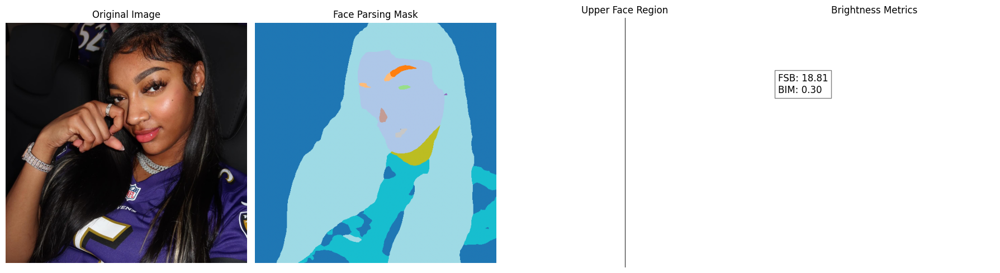

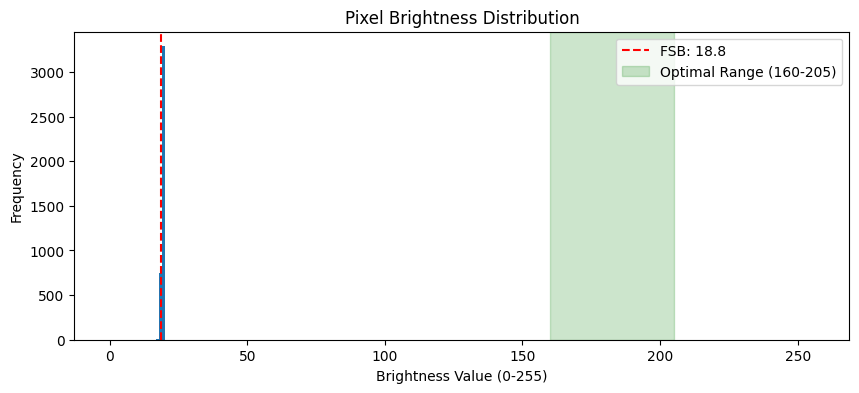


📊 Interpretation:
- FSB (Face Skin Brightness): 18.8/255
- BIM (Brightness Information Metric): 0.30
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1731261613_3498398435885600294_269551418.jpg...
🔎 Analyzing angelreese5_1731261613_3498398435885600294_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00,  3.00it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1729128616_3480505554759685952_269551418.jpg...
🔎 Analyzing angelreese5_1729128616_3480505554759685952_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 23.06it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1737483619_3550592402273874617_269551418.jpg...
🔎 Analyzing angelreese5_1737483619_3550592402273874617_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.98it/s]


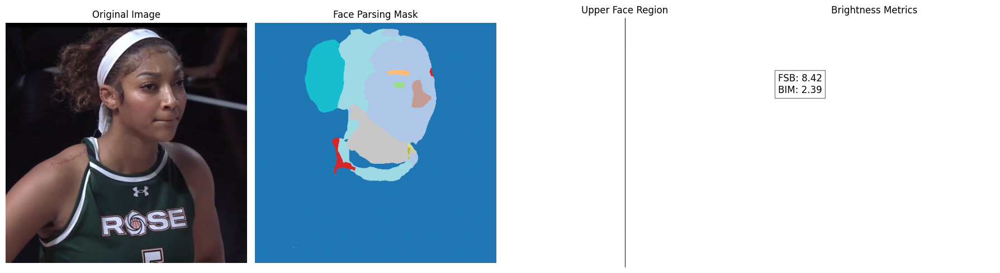

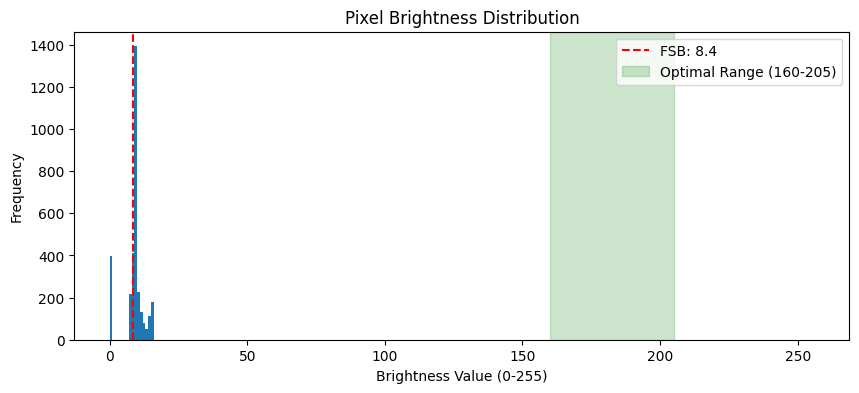


📊 Interpretation:
- FSB (Face Skin Brightness): 8.4/255
- BIM (Brightness Information Metric): 2.39
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1729091116_3480190980827281417_269551418.jpg...
🔎 Analyzing angelreese5_1729091116_3480190980827281417_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 14.24it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746655236_3627529498506339366_269551418.jpg...
🔎 Analyzing angelreese5_1746655236_3627529498506339366_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.80it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1727920818_3470373813387359297_269551418.jpg...
🔎 Analyzing angelreese5_1727920818_3470373813387359297_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 14.14it/s]


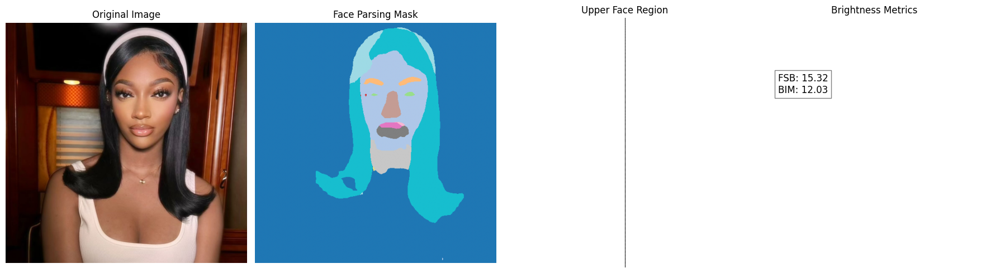

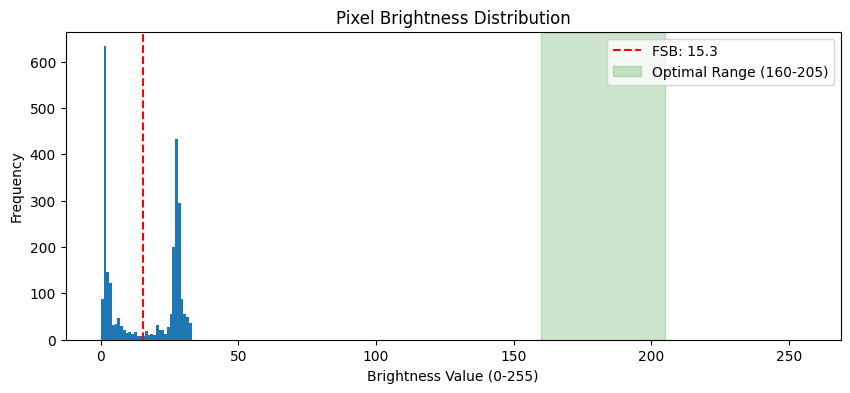


📊 Interpretation:
- FSB (Face Skin Brightness): 15.3/255
- BIM (Brightness Information Metric): 12.03
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1746655236_3627529499060136493_269551418.jpg...
🔎 Analyzing angelreese5_1746655236_3627529499060136493_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.76it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1742317235_3591139709705479593_269551418.jpg...
🔎 Analyzing angelreese5_1742317235_3591139709705479593_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 14.20it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1739129932_3564402674847608286_269551418.jpg...
🔎 Analyzing angelreese5_1739129932_3564402674847608286_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00,  4.22it/s]


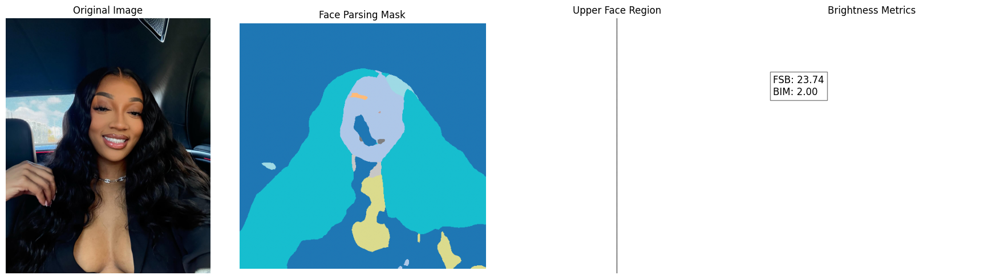

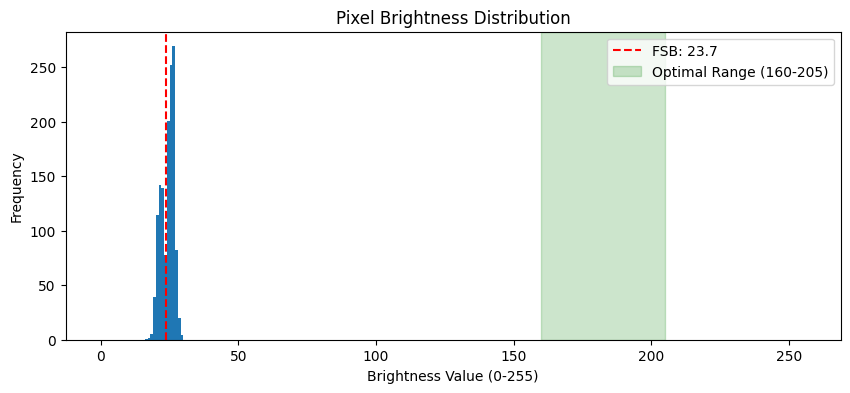


📊 Interpretation:
- FSB (Face Skin Brightness): 23.7/255
- BIM (Brightness Information Metric): 2.00
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1746125552_3623086191940438671_269551418.jpg...
🔎 Analyzing angelreese5_1746125552_3623086191940438671_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.77it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743692427_3602675658498110340_269551418.jpg...
🔎 Analyzing angelreese5_1743692427_3602675658498110340_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 16.20it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743959154_3604913126869915674_269551418.jpg...
🔎 Analyzing angelreese5_1743959154_3604913126869915674_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 20.68it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1717030800_3378861321079825224_269551418.jpg...
🔎 Analyzing angelreese5_1717030800_3378861321079825224_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.04it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1730386192_3491054871593374191_269551418.jpg...
🔎 Analyzing angelreese5_1730386192_3491054871593374191_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 21.49it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743292864_3599323879693697929_269551418.jpg...
🔎 Analyzing angelreese5_1743292864_3599323879693697929_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 16.34it/s]


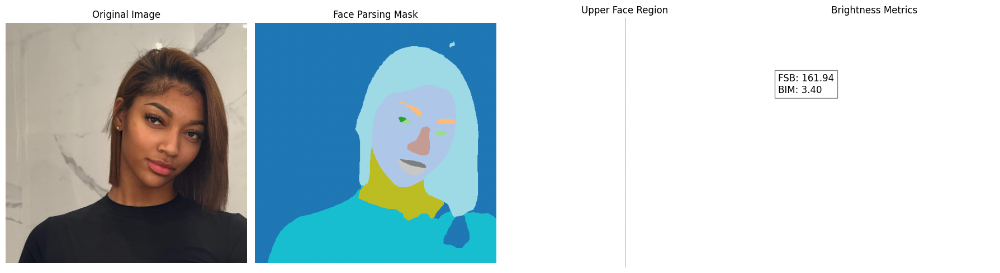

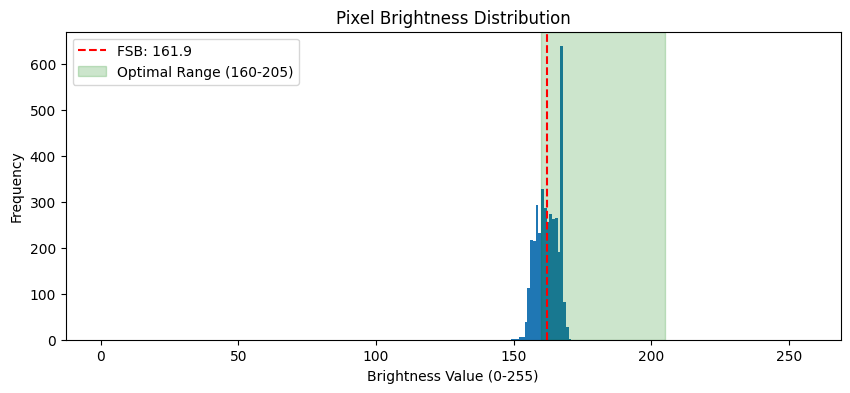


📊 Interpretation:
- FSB (Face Skin Brightness): 161.9/255
- BIM (Brightness Information Metric): 3.40
  ✅ Image is in optimal brightness range (160-205)
Processing data_root/data/real_data/reese/raw/angelreese5_1717030800_3378861321079984839_269551418.jpg...
🔎 Analyzing angelreese5_1717030800_3378861321079984839_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00,  7.08it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1735078821_3530419495623356349_269551418.jpg...
🔎 Analyzing angelreese5_1735078821_3530419495623356349_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.88it/s]


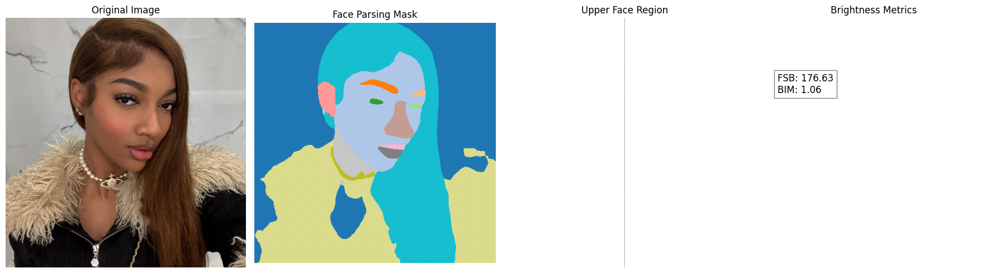

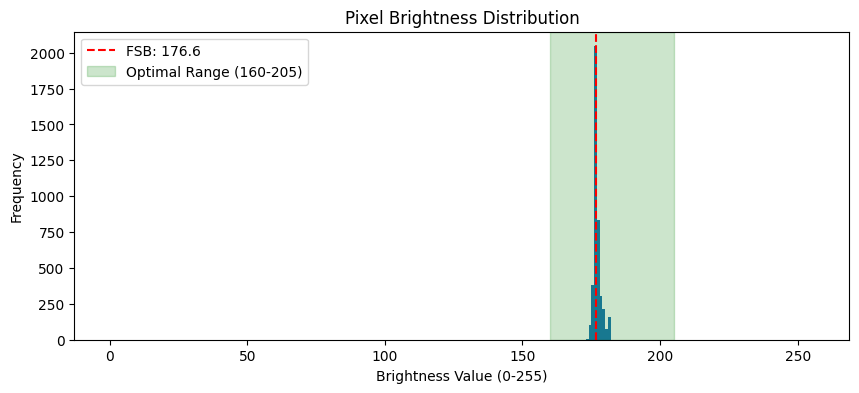


📊 Interpretation:
- FSB (Face Skin Brightness): 176.6/255
- BIM (Brightness Information Metric): 1.06
  ✅ Image is in optimal brightness range (160-205)
Processing data_root/data/real_data/reese/raw/angelreese5_1728948609_3478995548411434001_269551418.jpg...
🔎 Analyzing angelreese5_1728948609_3478995548411434001_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.62it/s]


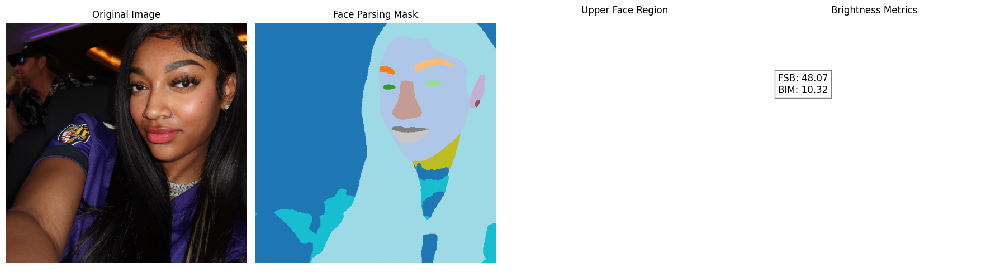

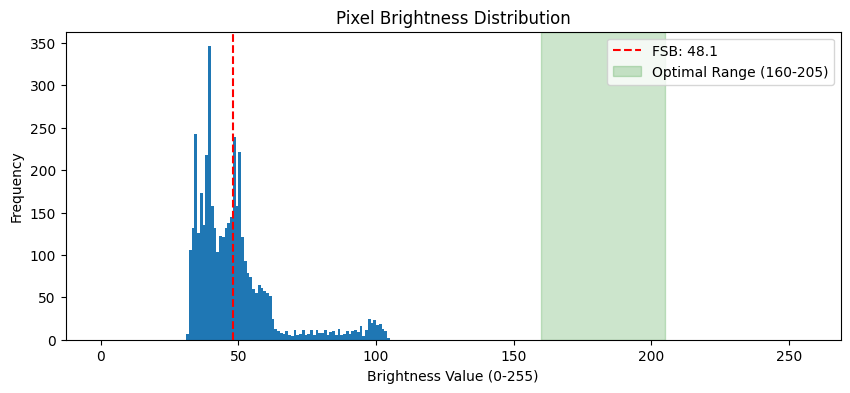


📊 Interpretation:
- FSB (Face Skin Brightness): 48.1/255
- BIM (Brightness Information Metric): 10.32
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1733418140_3516488688483390340_269551418.jpg...
🔎 Analyzing angelreese5_1733418140_3516488688483390340_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 13.42it/s]


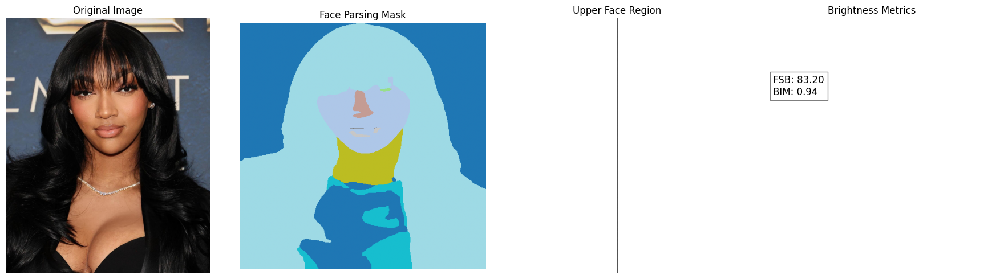

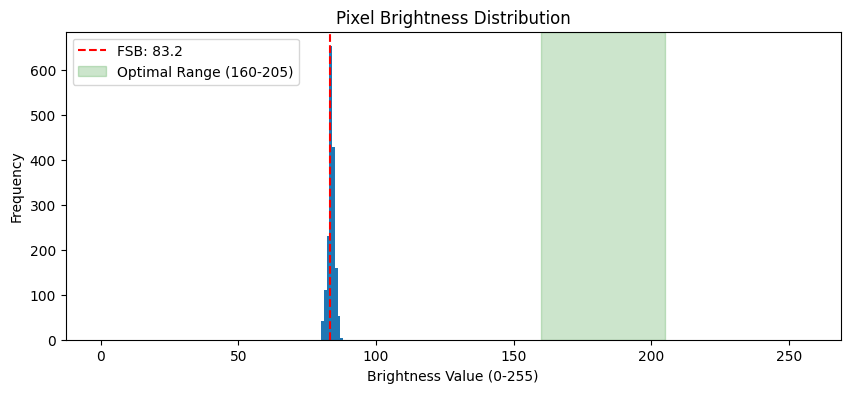


📊 Interpretation:
- FSB (Face Skin Brightness): 83.2/255
- BIM (Brightness Information Metric): 0.94
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1729091116_3480190981095739006_269551418.jpg...
🔎 Analyzing angelreese5_1729091116_3480190981095739006_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.75it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746125552_3623086191931969357_269551418.jpg...
🔎 Analyzing angelreese5_1746125552_3623086191931969357_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.53it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1749660408_3652738711441307640_269551418.jpg...
🔎 Analyzing angelreese5_1749660408_3652738711441307640_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 22.25it/s]


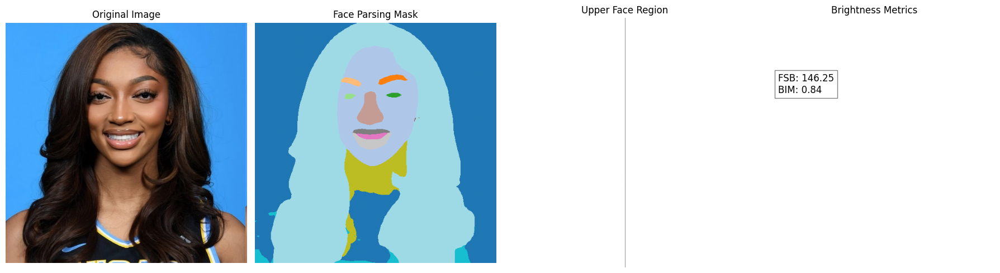

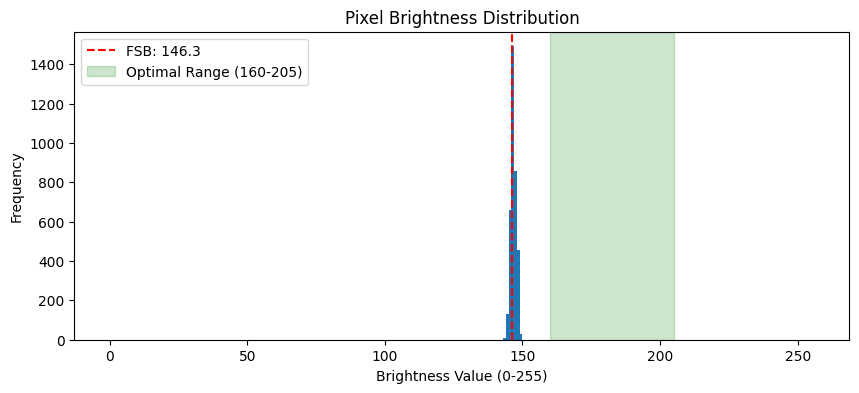


📊 Interpretation:
- FSB (Face Skin Brightness): 146.3/255
- BIM (Brightness Information Metric): 0.84
  ⚠️ Image may be UNDER-exposed (FSB < 160)
Processing data_root/data/real_data/reese/raw/angelreese5_1738519418_3559281313607915031_269551418.jpg...
🔎 Analyzing angelreese5_1738519418_3559281313607915031_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.04it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1744315659_3607903708135687379_269551418.jpg...
🔎 Analyzing angelreese5_1744315659_3607903708135687379_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.30it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746125552_3623086192133248228_269551418.jpg...
🔎 Analyzing angelreese5_1746125552_3623086192133248228_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.63it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743869696_3604162698397918211_269551418.jpg...
🔎 Analyzing angelreese5_1743869696_3604162698397918211_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.56it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1742317235_3591139709730676355_269551418.jpg...
🔎 Analyzing angelreese5_1742317235_3591139709730676355_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 24.18it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1749660408_3652738711449670090_269551418.jpg...
🔎 Analyzing angelreese5_1749660408_3652738711449670090_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.08it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743292864_3599323879895004099_269551418.jpg...
🔎 Analyzing angelreese5_1743292864_3599323879895004099_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.15it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743692427_3602675658263263252_269551418.jpg...
🔎 Analyzing angelreese5_1743692427_3602675658263263252_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.82it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1746655236_3627529498514839080_269551418.jpg...
🔎 Analyzing angelreese5_1746655236_3627529498514839080_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.25it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1726956309_3462282921766671525_269551418.jpg...
🔎 Analyzing angelreese5_1726956309_3462282921766671525_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.88it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1732475413_3508580525792952261_269551418.jpg...
🔎 Analyzing angelreese5_1732475413_3508580525792952261_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 16.94it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1733591430_3517942352083213411_269551418.jpg...
🔎 Analyzing angelreese5_1733591430_3517942352083213411_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.55it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743959154_3604913126886824425_269551418.jpg...
🔎 Analyzing angelreese5_1743959154_3604913126886824425_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.43it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1737483619_3550592402517222308_269551418.jpg...
🔎 Analyzing angelreese5_1737483619_3550592402517222308_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.50it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1737483619_3550592402567675539_269551418.jpg...
🔎 Analyzing angelreese5_1737483619_3550592402567675539_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 22.91it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1740345699_3574601272293950578_269551418.jpg...
🔎 Analyzing angelreese5_1740345699_3574601272293950578_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 22.07it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1740940699_3579592488701854662_269551418.jpg...
🔎 Analyzing angelreese5_1740940699_3579592488701854662_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.71it/s]


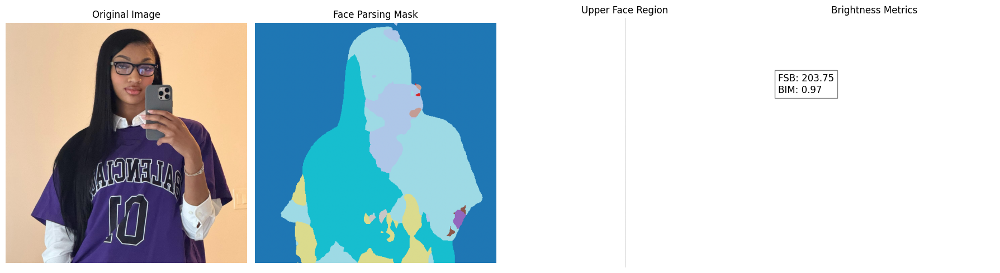

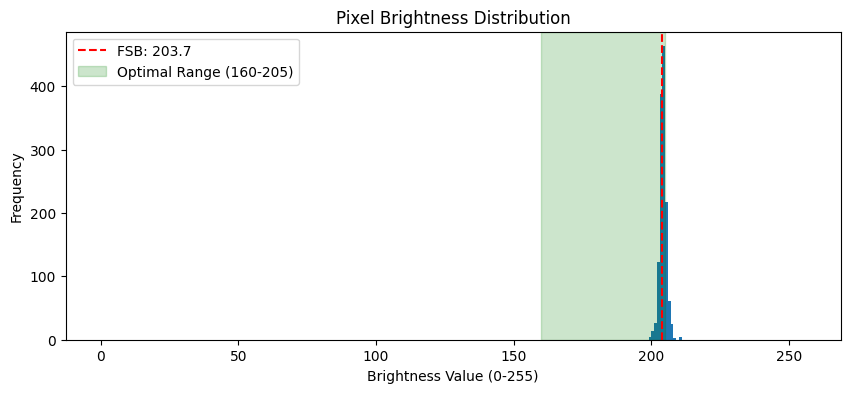


📊 Interpretation:
- FSB (Face Skin Brightness): 203.7/255
- BIM (Brightness Information Metric): 0.97
  ✅ Image is in optimal brightness range (160-205)
Processing data_root/data/real_data/reese/raw/angelreese5_1750095093_3656385116562522810_269551418.jpg...
🔎 Analyzing angelreese5_1750095093_3656385116562522810_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.30it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1743292864_3599323879702224953_269551418.jpg...
🔎 Analyzing angelreese5_1743292864_3599323879702224953_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.18it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1749660408_3652738711491473398_269551418.jpg...
🔎 Analyzing angelreese5_1749660408_3652738711491473398_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 19.48it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1717030800_3378861321155354297_269551418.jpg...
🔎 Analyzing angelreese5_1717030800_3378861321155354297_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.92it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1740345699_3574601272176462836_269551418.jpg...
🔎 Analyzing angelreese5_1740345699_3574601272176462836_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00,  5.23it/s]


❌ Analysis failed: OpenCV(4.12.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Processing data_root/data/real_data/reese/raw/angelreese5_1730386192_3491054871560010324_269551418.jpg...
🔎 Analyzing angelreese5_1730386192_3491054871560010324_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 17.71it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0
Processing data_root/data/real_data/reese/raw/angelreese5_1717030800_3378861321079786279_269551418.jpg...
🔎 Analyzing angelreese5_1717030800_3378861321079786279_269551418.jpg...


100%|████████████████████████████████████| 1/1 [00:00<00:00, 18.23it/s]


❌ Analysis failed: index -1 is out of bounds for axis 0 with size 0


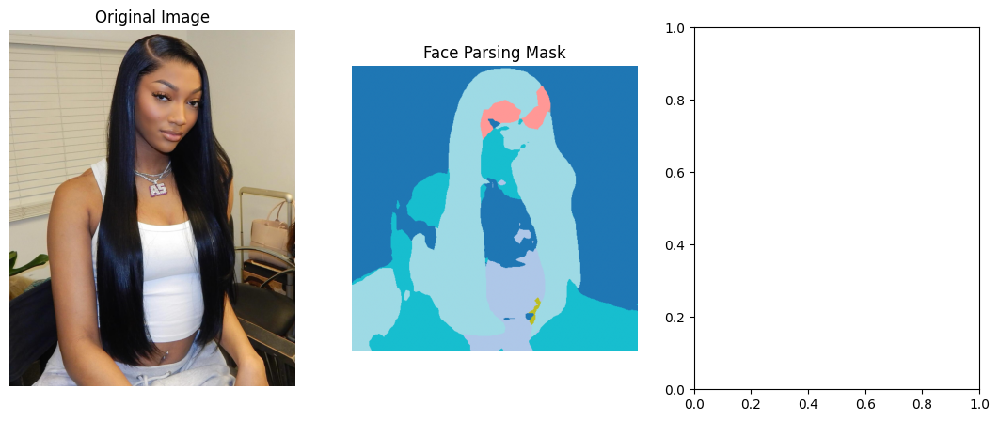

In [20]:
dir_path = "data_root/data/real_data/reese/raw"
for img_path in os.listdir(dir_path):
    if (img_path.endswith(".jpg") or img_path.endswith(".png")) and '._' not in img_path:
        full_img_path = os.path.join(dir_path, img_path)
        print(f"Processing {full_img_path}...")
        analyze_image(full_img_path)

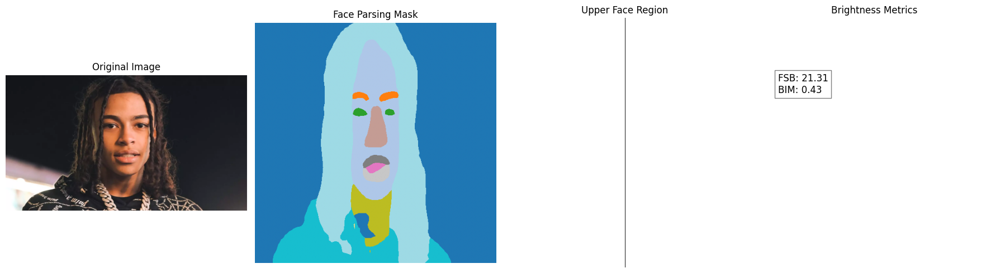

/tmp/ipykernel_3246784/2263005126.py:155: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(gray.ravel(), 256, [0,256])


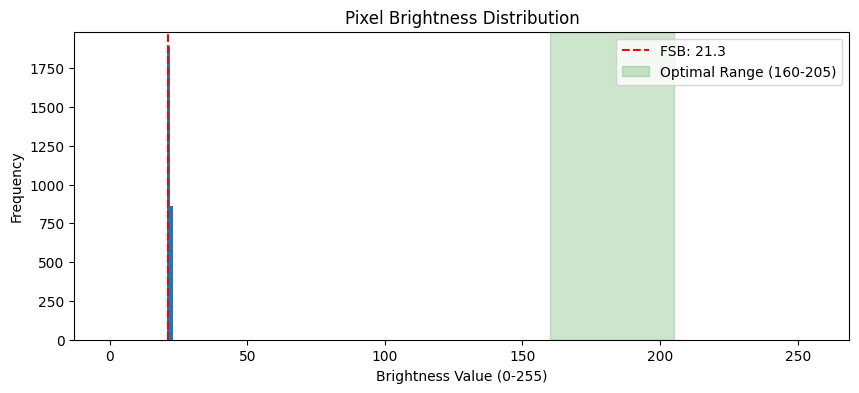


📊 Interpretation:
- FSB (Face Skin Brightness): 21.3/255
- BIM (Brightness Information Metric): 0.43
  ⚠️ Image may be UNDER-exposed (FSB < 160)


{'original': array([[[ 25,  21,  19],
         [ 25,  21,  19],
         [ 25,  21,  19],
         ...,
         [ 26,  22,  21],
         [ 41,  37,  36],
         [ 59,  55,  53]],
 
        [[ 25,  21,  19],
         [ 25,  21,  19],
         [ 25,  21,  19],
         ...,
         [ 26,  22,  21],
         [ 41,  37,  36],
         [ 59,  55,  53]],
 
        [[ 25,  21,  19],
         [ 25,  21,  19],
         [ 25,  21,  19],
         ...,
         [ 26,  22,  21],
         [ 41,  37,  36],
         [ 59,  55,  53]],
 
        ...,
 
        [[255, 254, 255],
         [255, 254, 255],
         [255, 254, 255],
         ...,
         [ 75,  74,  83],
         [ 85,  84,  94],
         [100, 100, 109]],
 
        [[255, 254, 255],
         [255, 254, 255],
         [255, 254, 255],
         ...,
         [ 75,  74,  83],
         [ 85,  84,  94],
         [100, 100, 109]],
 
        [[255, 254, 255],
         [255, 254, 255],
         [255, 254, 255],
         ...,
         [ 76,  

In [4]:
image_path = "data_root/data/real_data/osama/raw/645e68ab45d79f1e86e10526.webp"
analyze_image(image_path)

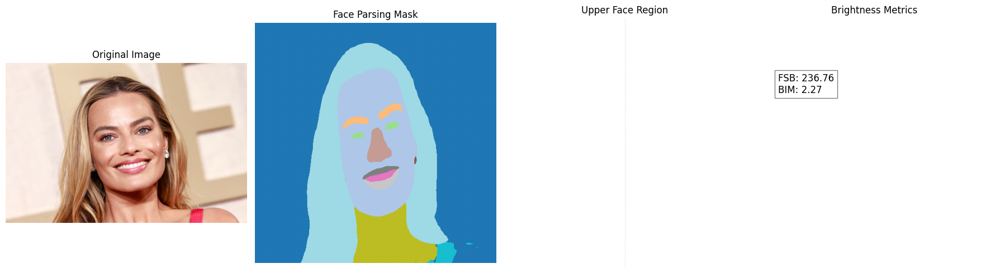

/tmp/ipykernel_3246784/2263005126.py:155: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(gray.ravel(), 256, [0,256])


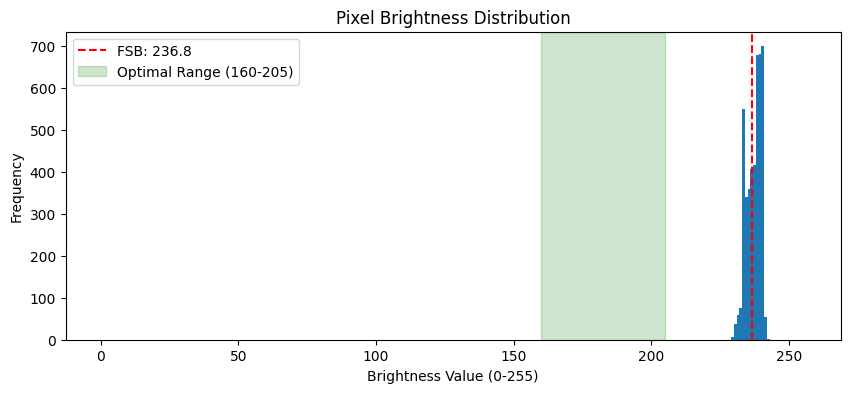


📊 Interpretation:
- FSB (Face Skin Brightness): 236.8/255
- BIM (Brightness Information Metric): 2.27
  ⚠️ Image may be OVER-exposed (FSB > 205)


{'original': array([[[228, 235, 250],
         [228, 235, 250],
         [228, 235, 250],
         ...,
         [214, 223, 237],
         [215, 224, 238],
         [215, 224, 238]],
 
        [[228, 235, 250],
         [228, 235, 250],
         [228, 235, 250],
         ...,
         [214, 223, 237],
         [215, 224, 238],
         [215, 224, 238]],
 
        [[228, 235, 250],
         [228, 235, 250],
         [228, 235, 250],
         ...,
         [215, 224, 238],
         [215, 224, 238],
         [216, 225, 239]],
 
        ...,
 
        [[165, 193, 223],
         [165, 193, 223],
         [165, 193, 223],
         ...,
         [208, 224, 241],
         [207, 223, 240],
         [206, 222, 239]],
 
        [[165, 193, 223],
         [165, 193, 223],
         [165, 193, 223],
         ...,
         [206, 222, 239],
         [205, 221, 238],
         [205, 221, 238]],
 
        [[165, 193, 223],
         [165, 193, 223],
         [165, 193, 223],
         ...,
         [205, 2

In [6]:

image_path = "data_root/data/real_data/mrobbie/raw/margot robbie.avif"
analyze_image(image_path)

In [1]:
# Face Brightness Analysis Notebook
import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, clear_output

# ==========================================
# 1. PATH CONFIGURATION - CRITICAL FIX
# ==========================================
BASE_DIR = "/home/nessessence/mnt_tl_vision16/home/nessessence/uul"
FACE_BRIGHTNESS_DIR = os.path.join(BASE_DIR, "FaceBrightness")
FACE_PARSING_DIR = os.path.join(FACE_BRIGHTNESS_DIR, "face_parsing")

# Clear conflicting paths and add correct ones
sys.path = [p for p in sys.path if "uul" not in p]
sys.path.insert(0, FACE_PARSING_DIR)
sys.path.insert(0, FACE_BRIGHTNESS_DIR)

print("✅ Python path configured:")
for p in sys.path[:2]:
    print(f"→ {p}")

# ==========================================
# 2. IMPORTS WITH VERIFICATION
# ==========================================
try:
    # Verify we're importing from correct location
    import face_parsing.test as face_test
    print(f"✓ Importing from: {face_test.__file__}")
    
    if not face_test.__file__.startswith(FACE_PARSING_DIR):
        raise ImportError("Wrong test.py being imported!")
    
    from face_parsing.test import evaluate
    from demographic_face_analyze import without_beard_region
    print("✓ All imports successful!")
    
except Exception as e:
    print(f"\n❌ Import Error: {e}")
    print("\n🔍 Debugging Info:")
    
    # Check test.py contents
    test_py_path = os.path.join(FACE_PARSING_DIR, "test.py")
    if os.path.exists(test_py_path):
        print(f"\nContents of {test_py_path}:")
        with open(test_py_path, 'r') as f:
            print(f.read(500))  # Show first 500 chars
        
    print("\n💡 Solutions:")
    print("1. Temporary rename conflicting file:")
    print(f"   !mv {BASE_DIR}/test.py {BASE_DIR}/test.py.BAK")
    print("2. Or use absolute import:")
    print("   from FaceBrightness.face_parsing.test import evaluate")
    raise

# ==========================================
# 3. CORE ANALYSIS FUNCTIONS
# ==========================================
def weights_calc(data):
    """Calculate weights for brightness values"""
    num_list = list(data.values())
    total = sum(num_list)
    return np.array([num/total for num in num_list])

def information_analysis(image):
    """Calculate Brightness Information Metric (BIM)"""
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Calculate histogram
    hist = cv2.calcHist([image], [0], None, [256], [0,256])
    hist /= hist.sum()  # Normalize
    
    level = np.arange(256)
    avg_brightness = np.sum(level * hist.flatten())
    bim = np.sum(np.abs(level - avg_brightness) * hist.flatten())
    return bim

def process_face_image(img_path):
    """Full processing pipeline for single image"""
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise ValueError(f"Could not read image at {img_path}")
    
    # Get face mask
    mask = evaluate([img])[0]  # evaluate expects a list
    
    # Extract upper face region
    upper_face = without_beard_region(img, mask)
    
    # Calculate metrics
    bim = information_analysis(upper_face)
    
    return {
        'original': img,
        'mask': mask,
        'upper_face': upper_face,
        'bim': bim
    }

# ==========================================
# 4. VISUALIZATION FUNCTIONS
# ==========================================
def display_results(results):
    """Display processing results with matplotlib"""
    clear_output(wait=True)
    
    # Create figure
    plt.figure(figsize=(15, 5))
    
    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(results['original'], cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')
    
    # Face Mask
    plt.subplot(1, 3, 2)
    plt.imshow(results['mask'], cmap='gray')
    plt.title("Face Parsing Mask")
    plt.axis('off')
    
    # Upper Face Region
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(results['upper_face'], cv2.COLOR_BGR2RGB))
    plt.title("Upper Face Region")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Brightness Histogram
    gray = cv2.cvtColor(results['upper_face'], cv2.COLOR_BGR2GRAY) if len(results['upper_face'].shape) == 3 else results['upper_face']
    plt.figure(figsize=(8, 4))
    plt.hist(gray.ravel(), 256, [0,256])
    plt.title("Pixel Brightness Distribution")
    plt.xlabel("Brightness Value")
    plt.ylabel("Frequency")
    plt.show()
    
    # Print BIM
    print(f"🔍 Brightness Information Metric (BIM): {results['bim']:.2f}")

# ==========================================
# 5. NOTEBOOK INTERFACE
# ==========================================
def analyze_image(image_path):
    """Complete analysis workflow"""
    try:
        print(f"Processing {os.path.basename(image_path)}...")
        results = process_face_image(image_path)
        display_results(results)
        return results
    except Exception as e:
        print(f"❌ Error processing image: {e}")
        raise

# ==========================================
# 6. EXAMPLE USAGE
# ==========================================
# Uncomment to run with a sample image
# image_path = os.path.join(FACE_BRIGHTNESS_DIR, "images", "sample.jpg")
# analyze_image(image_path)

✅ Python path configured:
→ /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness
→ /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness/face_parsing
✓ Importing from: /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness/face_parsing/test.py
✓ All imports successful!


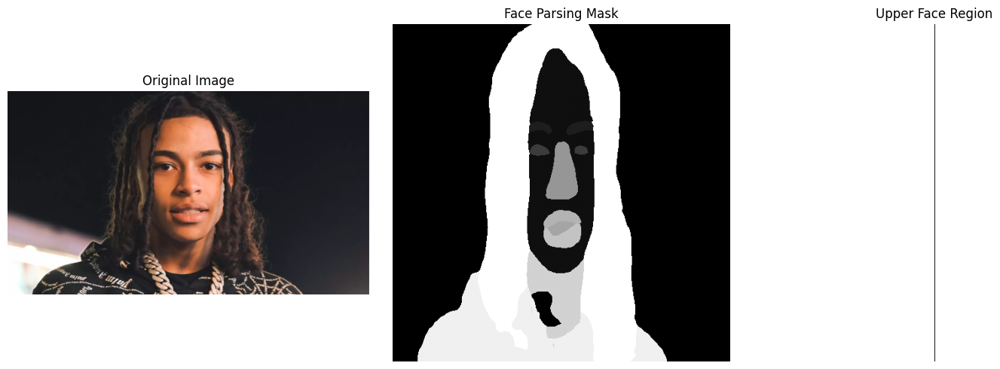

/tmp/ipykernel_3246784/3955481605.py:138: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(gray.ravel(), 256, [0,256])


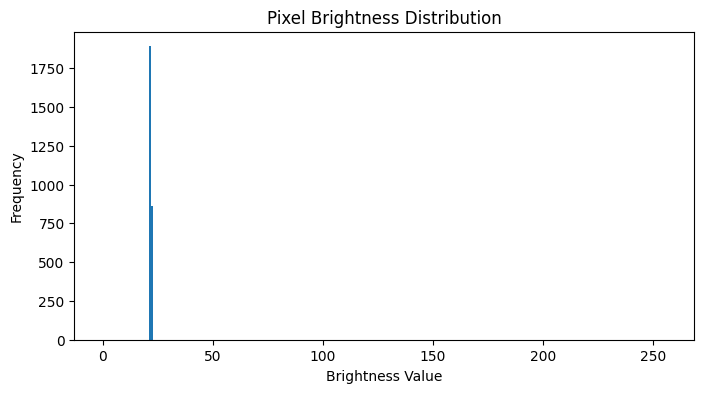

🔍 Brightness Information Metric (BIM): 0.43


{'original': array([[[ 25,  21,  19],
         [ 25,  21,  19],
         [ 25,  21,  19],
         ...,
         [ 26,  22,  21],
         [ 41,  37,  36],
         [ 59,  55,  53]],
 
        [[ 25,  21,  19],
         [ 25,  21,  19],
         [ 25,  21,  19],
         ...,
         [ 26,  22,  21],
         [ 41,  37,  36],
         [ 59,  55,  53]],
 
        [[ 25,  21,  19],
         [ 25,  21,  19],
         [ 25,  21,  19],
         ...,
         [ 26,  22,  21],
         [ 41,  37,  36],
         [ 59,  55,  53]],
 
        ...,
 
        [[255, 254, 255],
         [255, 254, 255],
         [255, 254, 255],
         ...,
         [ 75,  74,  83],
         [ 85,  84,  94],
         [100, 100, 109]],
 
        [[255, 254, 255],
         [255, 254, 255],
         [255, 254, 255],
         ...,
         [ 75,  74,  83],
         [ 85,  84,  94],
         [100, 100, 109]],
 
        [[255, 254, 255],
         [255, 254, 255],
         [255, 254, 255],
         ...,
         [ 76,  

In [2]:
image_path = "data_root/data/real_data/osama/raw/645e68ab45d79f1e86e10526.webp"
analyze_image(image_path)

In [1]:
import os
import sys

# ==========================================
# 1. PATH CONFIGURATION - CRITICAL FIX
# ==========================================
BASE_DIR = "/home/nessessence/mnt_tl_vision16/home/nessessence/uul"
FACE_BRIGHTNESS_DIR = os.path.join(BASE_DIR, "FaceBrightness")
FACE_PARSING_DIR = os.path.join(FACE_BRIGHTNESS_DIR, "face_parsing")

# CLEAR existing paths that might cause conflicts
sys.path = [p for p in sys.path if "uul" not in p]

# Add SPECIFIC paths in correct order
sys.path.insert(0, FACE_PARSING_DIR)  # Must be first
sys.path.insert(0, FACE_BRIGHTNESS_DIR)

print("Python will ONLY search in:")
for p in sys.path[:2]:
    print(f"→ {p}")

# ==========================================
# 2. ABSOLUTE IMPORT WITH VERIFICATION
# ==========================================
try:
    # VERIFY we're importing from correct location
    import face_parsing.test as face_test
    print(f"✓ Importing from: {face_test.__file__}")
    
    if not face_test.__file__.startswith(FACE_PARSING_DIR):
        raise ImportError("WRONG test.py being imported!")
    
    from face_parsing.test import evaluate
    from demographic_face_analyze import without_beard_region
    print("✓ All imports successful!")
    
except Exception as e:
    print(f"\n❌ Critical Error: {e}")
    print("\n🔍 Debugging Info:")
    
    # Check test.py contents
    test_py_path = os.path.join(FACE_PARSING_DIR, "test.py")
    if os.path.exists(test_py_path):
        print(f"Contents of {test_py_path}:")
        with open(test_py_path, 'r') as f:
            print(f.read(500))  # Show first 500 chars
        
    print("\n💡 Solution:")
    print("1. TEMPORARILY rename conflicting file:")
    print(f"   !mv {BASE_DIR}/test.py {BASE_DIR}/test.py.BAK")
    print("2. Or use absolute import:")
    print("   from FaceBrightness.face_parsing.test import evaluate")
    raise

# ==========================================
# 3. REST OF YOUR CODE (UNCHANGED)
# ==========================================
# [Keep all your existing analysis functions here]

# ==========================================
# 4. TEST EXECUTION
# ==========================================
def test_imports():
    try:
        print("\nTesting evaluate function exists...")
        print(f"evaluate function: {evaluate.__module__}")
        return True
    except Exception as e:
        print(f"Test failed: {e}")
        return False

if test_imports():
    print("\n✅ Ready for analysis!")
    # Proceed with analyze_face()
else:
    print("\n❌ Still having issues? Try:")
    print("1. Clean Python kernel restart")
    print("2. Temporary rename: !mv ~/uul/test.py ~/uul/test.py.BAK")

Python will ONLY search in:
→ /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness
→ /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness/face_parsing
✓ Importing from: /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness/face_parsing/test.py
✓ All imports successful!

Testing evaluate function exists...
evaluate function: face_parsing.test

✅ Ready for analysis!


In [2]:
import torch

In [1]:
# face_brightness_analysis_final.ipynb

import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. PATH CONFIGURATION (YOUR EXACT STRUCTURE)
# ==========================================
BASE_DIR = "/home/nessessence/mnt_tl_vision16/home/nessessence/uul"
FACE_BRIGHTNESS_DIR = os.path.join(BASE_DIR, "FaceBrightness")
FACE_PARSING_DIR = os.path.join(FACE_BRIGHTNESS_DIR, "face_parsing")

# Add to Python path in correct order
sys.path.insert(0, FACE_PARSING_DIR)  # face_parsing first
sys.path.insert(0, FACE_BRIGHTNESS_DIR)  # Then FaceBrightness
sys.path.insert(0, BASE_DIR)  # Finally base directory

print("Python will search in these paths:")
for p in sys.path[:3]:  # Only show relevant paths
    print(f"→ {p}")

# ==========================================
# 2. IMPORTS WITH ABSOLUTE PATHS
# ==========================================
try:
    # Option 1: Direct import (preferred)
    from face_parsing.test import evaluate
    
    # Option 2: Alternative absolute import
    # from FaceBrightness.face_parsing.test import evaluate
    
    from demographic_face_analyze import without_beard_region
    print("✓ All imports successful!")
    
except ImportError as e:
    print(f"\n❌ Import Error: {e}")
    print("\nDebugging Info:")
    print(f"1. FaceParsing exists? {os.path.exists(FACE_PARSING_DIR)}")
    if os.path.exists(FACE_PARSING_DIR):
        print(f"   Contents: {os.listdir(FACE_PARSING_DIR)}")
    
    print(f"\n2. FaceBrightness exists? {os.path.exists(FACE_BRIGHTNESS_DIR)}")
    if os.path.exists(FACE_BRIGHTNESS_DIR):
        print(f"   Contents: {os.listdir(FACE_BRIGHTNESS_DIR)}")
    
    print("\n🛠️ Solutions:")
    print("1. Verify face_parsing/test.py exists")
    print("2. Check for missing files in face_parsing/")
    print("3. Run: !pip install -r FaceBrightness/face_parsing/requirements.txt")
    raise

# ==========================================
# 3. ANALYSIS FUNCTIONS (UNCHANGED)
# ==========================================
def show_image(img, title="Image", cmap=None):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()

def calculate_bim(image):
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hist = cv2.calcHist([image], [0], None, [256], [0,256])
    hist /= hist.sum()
    level = np.arange(256)
    avg_brightness = np.sum(level * hist.flatten())
    return np.sum(np.abs(level - avg_brightness) * hist.flatten())

# ==========================================
# 4. MAIN EXECUTION WITH PATH SAFEGUARDS
# ==========================================
def analyze_face(image_path):
    try:
        # Verify image exists
        if not os.path.exists(image_path):
            raise FileNotFoundError(f"Image not found at {image_path}")
        
        # Load and process
        img = cv2.imread(image_path)
        mask = evaluate([img])[0]
        upper_face = without_beard_region(img, mask)
        bim = calculate_bim(upper_face)
        
        # Display results
        print(f"\n🔍 Brightness Information Metric: {bim:.2f}")
        show_image(img, "Original Image")
        show_image(mask, "Face Parsing Mask", cmap='gray')
        show_image(upper_face, "Upper Face Region")
        
        plt.hist(upper_face.ravel(), 256, [0,256])
        plt.title("Pixel Brightness Distribution")
        plt.show()
        
        return bim
    
    except Exception as e:
        print(f"\n⚠️ Runtime Error: {e}")
        print(f"Current working dir: {os.getcwd()}")
        print(f"Attempted image path: {os.path.abspath(image_path)}")
        raise

# ==========================================
# 5. RUN WITH YOUR IMAGE (MODIFY THIS PATH)
# ==========================================
IMAGE_PATH = os.path.join(FACE_BRIGHTNESS_DIR, "images", "sample.jpg")  # CHANGE ME

# Create images directory if missing
os.makedirs(os.path.join(FACE_BRIGHTNESS_DIR, "images"), exist_ok=True)

# Run analysis
if os.path.exists(IMAGE_PATH):
    analyze_face(IMAGE_PATH)
else:
    print(f"\nℹ️ Sample image not found at: {IMAGE_PATH}")
    print("Please either:")
    print(f"1. Place your image in {os.path.join(FACE_BRIGHTNESS_DIR, 'images')}")
    print("2. Modify IMAGE_PATH variable above")
    print("\nYou can upload files with:")
    print("from google.colab import files  # Colab only")
    print("uploaded = files.upload()")

Python will search in these paths:
→ /home/nessessence/mnt_tl_vision16/home/nessessence/uul
→ /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness
→ /home/nessessence/mnt_tl_vision16/home/nessessence/uul/FaceBrightness/face_parsing

❌ Import Error: cannot import name 'evaluate' from 'test' (/home/nessessence/mnt_tl_vision16/home/nessessence/uul/test.py)

Debugging Info:
1. FaceParsing exists? True
   Contents: ['loss.py', 'makeup.py', 'makeup', 'face_dataset.py', 'prepropess_data.py', 'optimizer.py', '__pycache__', '6.jpg', 'model.py', 'hair.png', 'transform.py', 'LICENSE', 'train.py', 'README.md', 'evaluate.py', 'logger.py', 'resnet.py', 'modules', '.gitignore', 'test.py']

2. FaceBrightness exists? True
   Contents: ['utils', 'single_image_brightness.py', 'iFace_FSB_distribution.py', 'genuien_comparison.py', 'face_parsing', 'similarity_distribution.py', 'brightness_information.py', '__pycache__', 'LICENSE', '.idea', 'README.md', 'imposter_comparison.py', 'demographic

ImportError: cannot import name 'evaluate' from 'test' (/home/nessessence/mnt_tl_vision16/home/nessessence/uul/test.py)

In [58]:
# face_brightness_analysis_full.ipynb

import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Image

# ======================
# 1. PATH CONFIGURATION
# ======================
NOTEBOOK_DIR = os.getcwd()  # Get current working directory
FACE_PARSING_DIR = os.path.join(NOTEBOOK_DIR,"FaceBrightness", "face_parsing")

# Add to Python path
sys.path.insert(0, NOTEBOOK_DIR)
sys.path.insert(0, FACE_PARSING_DIR)

# ======================
# 2. IMPORTS WITH ERROR HANDLING
# ======================
try:
    from face_parsing.test import evaluate
    from face_parsing.logger import setup_logger
    from face_parsing.model import BiSeNet
    from demographic_face_analyze import without_beard_region
except ImportError as e:
    print(f"Import Error: {e}")
    print("\nTroubleshooting steps:")
    print("1. Verify face_parsing/ contains all required files (test.py, logger.py, model.py)")
    print("2. Check repository structure:")
    print(f"Current directory: {NOTEBOOK_DIR}")
    print(f"Contents: {os.listdir()}")
    if os.path.exists(FACE_PARSING_DIR):
        print(f"\nface_parsing/ contents: {os.listdir(FACE_PARSING_DIR)}")
    else:
        print("\nface_parsing/ directory not found!")
    raise

# ======================
# 3. HELPER FUNCTIONS
# ======================
def show_image(img, title="Image", cmap=None):
    """Display an image with matplotlib"""
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()

def calculate_bim(image):
    """Calculate Brightness Information Metric"""
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    hist = cv2.calcHist([image], [0], None, [256], [0,256])
    hist /= hist.sum()  # Normalize to probabilities
    
    level = np.arange(256)
    avg_brightness = np.sum(level * hist.flatten())
    bim = np.sum(np.abs(level - avg_brightness) * hist.flatten())
    return bim

# ======================
# 4. MAIN ANALYSIS FUNCTION
# ======================
def analyze_face(image_path):
    """Complete face brightness analysis pipeline"""
    try:
        # Load image
        img = cv2.imread(image_path)
        if img is None:
            raise FileNotFoundError(f"Image not found at {image_path}")
        
        # Face parsing
        print("Running face parsing...")
        mask = evaluate([img])[0]
        
        # Extract upper face region
        upper_face = without_beard_region(img, mask)
        
        # Calculate metrics
        bim = calculate_bim(upper_face)
        
        # Visualization
        print(f"\nBrightness Information Metric: {bim:.2f}")
        show_image(img, "Original Image")
        show_image(mask, "Face Parsing Mask", cmap='gray')
        show_image(upper_face, "Upper Face Region")
        
        # Histogram
        gray = cv2.cvtColor(upper_face, cv2.COLOR_BGR2GRAY) if len(upper_face.shape) == 3 else upper_face
        plt.hist(gray.ravel(), 256, [0,256])
        plt.title("Pixel Brightness Distribution")
        plt.xlabel("Brightness Value")
        plt.ylabel("Frequency")
        plt.show()
        
        return bim
    
    except Exception as e:
        print(f"Error during analysis: {e}")
        raise

# ======================
# 5. EXECUTION
# ======================
if __name__ == '__main__':
    # Example usage (replace with your image path)
    image_path = "images/sample_face.jpg"
    
    # Verify image exists
    if not os.path.exists(image_path):
        print(f"Creating sample directory at {os.path.abspath('images')}")
        os.makedirs("images", exist_ok=True)
        print("Please add your face image to the 'images' directory")
    else:
        analyze_face(image_path)

Import Error: No module named 'face_parsing'

Troubleshooting steps:
1. Verify face_parsing/ contains all required files (test.py, logger.py, model.py)
2. Check repository structure:
Current directory: /home/nessessence/mnt_tl_vision16/home/nessessence/uul
Contents: ['run_uul_lora_19_2.sh', 'test_tokenizer.ipynb', 'test', 'run_train_db_lora_gpu1.sh', 'configs', 'add_cfg_strucure.py', 'temp', 'load_erased.ipynb', '.ipynb_checkpoints', 'run_uul_lora_20_2.sh', 'moodeng copy.sh', 'run_uul_lora_21_1.sh', '.DS_Store', 'assets', 'testtest', 'old_moodeng.sh', 'inference.py', 'wandb', 'cuda_11.8.0_520.61.05_linux.run', 'analyze_mace_cache.ipynb', 'test_load_lora_text_encoder.ipynb', 'test_chillout.ipynb', 'evaluate_2.sh', 'data', 'run_uul_lora_20_0.sh', 'loaders_222.py', 'run_eval_cmmd.sh', 'run_uul_lora_21_3.sh', 'run_uul_lora_19_0.sh', 'coco_caption.ipynb', 'cmmd_evaluate.ipynb', 'evaluate_1.sh', 'data_preparation.py', ' maskd maska maskt maska mask_ maskr masko masko maskt mask', 'test_.py',

ModuleNotFoundError: No module named 'face_parsing'

In [59]:
print(NOTEBOOK_DIR)

/home/nessessence/mnt_tl_vision16/home/nessessence/uul


In [57]:
# face_brightness_analysis.ipynb

import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Image
import os
import sys

# 1. Setup Paths
# NOTEBOOK_DIR = os.getcwd()
# sys.path.insert(0, os.path.join(NOTEBOOK_DIR, "face-parsing.PyTorch"))
sys.path.insert(0, os.path.abspath("."))  # Add project root to path
from face_parsing.test import evaluate
from demographic_face_analyze import without_beard_region


# 3. Helper Functions
def show_image(img, title="Image", cmap=None):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()

def calculate_bim(image):
    """Calculate Brightness Information Metric"""
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    hist = cv2.calcHist([image], [0], None, [256], [0,256])
    hist /= hist.sum()  # Normalize to probabilities
    
    level = np.arange(256)
    avg_brightness = np.sum(level * hist.flatten())
    bim = np.sum(np.abs(level - avg_brightness) * hist.flatten())
    return bim

# 4. Main Analysis Function
def analyze_face(image_path):
    # Load image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not read image at {image_path}")
        return
    
    # Get face mask
    mask = evaluate([img])[0]  # Returns list of masks
    upper_face = without_beard_region(img, mask)
    
    # Calculate metrics
    bim = calculate_bim(upper_face)
    
    # Visualize
    print(f"Brightness Information Metric: {bim:.2f}")
    show_image(img, "Original Image")
    show_image(mask, "Face Parsing Mask", cmap='gray')
    show_image(upper_face, "Upper Face Region")
    
    # Histogram
    gray = cv2.cvtColor(upper_face, cv2.COLOR_BGR2GRAY) if len(upper_face.shape) == 3 else upper_face
    plt.hist(gray.ravel(), 256, [0,256])
    plt.title("Pixel Brightness Distribution")
    plt.xlabel("Brightness Value")
    plt.ylabel("Frequency")
    plt.show()



ModuleNotFoundError: No module named 'face_parsing'

In [ ]:
# 5. Run Analysis (Change path to your image)
analyze_face("images/sample_face.jpg")  # Replace with your image path